
# CAPSTONE PROJECT AIML   : FINAL REPORT

## COMPUTER VISION - PNEUMONIA DETECTION CHALLENGE

### Date Submitted: 21 May 2023

### GROUP 1 CV1 : Neeti Choksi, Nitish Kumar Jha, Rangarajan Kasturi, Revathy, Solasa Mani Mohan Trinath



Step 1

Installing pydicom for reading dicom image


In [ ]:
pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 79.4 MB/s eta 0:00:00


In [ ]:
import os
import pandas as pd
import numpy as np
import pydicom
import glob, pylab
import pandas as pd
import pydicom
import numpy as np
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import gc
import os
import warnings
warnings.simplefilter(action = 'ignore')
from google.colab import drive

In [ ]:
# Mount Google Drive to access the data files
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_train_labels.csv')
print(df.head())

                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1


In [ ]:
#extract test data
import zipfile
test_images_zip = '/content/drive/MyDrive/Capstone-project/stage_2_test_images.zip'
with zipfile.ZipFile(test_images_zip, 'r') as zip_ref:
    zip_ref.extractall()

In [ ]:
#extract train data
import zipfile
train_images_zip = '/content/drive/MyDrive/Capstone-project/stage_2_train_images.zip'
with zipfile.ZipFile(train_images_zip, 'r') as zip_ref:
    zip_ref.extractall()

In [ ]:
patientId = df['patientId'][1]
dcm_file = '/content/stage_2_train_images/%s.dcm' % patientId


dcm_data = pydicom.read_file(dcm_file)

print(dcm_data)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.26024.1517874469.23011
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.26024.1517874469.23011
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time        

In [ ]:
df

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1


From the above we can see that each row in the CSV file contains a patientId (one unique value per patient), a target (either 0 or 1 for absence or presence of pneumonia, respectively) and the corresponding abnormality bounding box defined by the upper-left hand corner (x, y) coordinate and its corresponding width and height. <br>

Target: 0 = no pneumonia <br>
Target: 1 = Pneumonia <br>

at index[0], the first record: the corresponding bounding box information is set to NaN as it is 0 = No pneumonia <br>
at index[4], the fifth record: bounding box coordinates given as it is 1 i.e. pnuemonia found:

Thrrefore, important thing is that a given patientId may have multiple boxes if more than one area of pneumonia is detected.

**X-ray medical images-DICOM files:**<br>

X-ray images are stored in the format DICOM files - *.dcm format.<br>

MicroDicom DICOM Viewer: is used to view the x-rays. To visualise the x-ray report.<br>

Each x-ray contains a combination of header metadata as well as underlying raw image arrays for pixel data. <br>

In Python, one popular library to access and manipulate DICOM files is the pydicom module.

To use the pydicom library, first find the DICOM file for a given patientId by simply looking for the matching file in the stage_2_train_images/ folder, and the use the pydicom.read_file() method to load the data:

In [ ]:
im = dcm_data.pixel_array
print(type(im))
print(im.dtype)
print(im.shape)

<class 'numpy.ndarray'>
uint8
(1024, 1024)


As we can see here, the pixel array data is stored as a Numpy array, a powerful numeric Python library for handling and manipulating matrix data (among other things). <br>

1) It is apparent here that the original radiographs have been preprocessed for us as follows:<br>

2) The relatively high dynamic range, high bit-depth original images have been rescaled to 8-bit encoding (256 grayscales).<br>
For the radiologists out there, this means that the images have been windowed and leveled already. In clinical practice, manipulating the image bit-depth is typically done manually by a radiologist to highlight certain disease processes.<br>

3) The relativley large original image matrices (typically acquired at >2000 x 2000) have been resized to the data-science friendly shape of 1024 x 1024. The diagnosis of most pneumonia cases can typically be made at this resolution. To visually assess the feasibility of diagnosis at this resolution, and to determine the optimal resolution for pneumonia detection (oftentimes can be done at a resolution even smaller than 1024 x 1024), consider consultation with a radiogist physician.

**Visualizing An Example**<br>

To take a look at this first DICOM image, let's use the pylab.imshow() method:

(-0.5, 1023.5, 1023.5, -0.5)

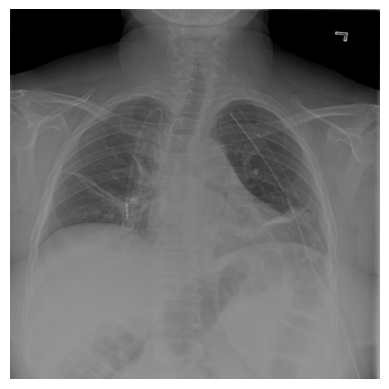

In [ ]:
pylab.imshow(im, cmap=pylab.cm.gist_gray)
pylab.axis('off')

**Data Overview:**<br>

As mentioned above, any given patient may potentially have many boxes if there are several different suspicious areas of pneumonia. <br>

To make the current CSV file dataframe into a dictionary with unique entries, consider the following method:

In [ ]:
def parse_data(df):
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'dicom': '/content/stage_2_train_images/%s.dcm' % pid,
                'label': row['Target'],
                'boxes': []}

        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed

In [ ]:
parsed = parse_data(df)
parsed

{'0004cfab-14fd-4e49-80ba-63a80b6bddd6': {'dicom': '/content/stage_2_train_images/0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm',
  'label': 0,
  'boxes': []},
 '00313ee0-9eaa-42f4-b0ab-c148ed3241cd': {'dicom': '/content/stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c148ed3241cd.dcm',
  'label': 0,
  'boxes': []},
 '00322d4d-1c29-4943-afc9-b6754be640eb': {'dicom': '/content/stage_2_train_images/00322d4d-1c29-4943-afc9-b6754be640eb.dcm',
  'label': 0,
  'boxes': []},
 '003d8fa0-6bf1-40ed-b54c-ac657f8495c5': {'dicom': '/content/stage_2_train_images/003d8fa0-6bf1-40ed-b54c-ac657f8495c5.dcm',
  'label': 0,
  'boxes': []},
 '00436515-870c-4b36-a041-de91049b9ab4': {'dicom': '/content/stage_2_train_images/00436515-870c-4b36-a041-de91049b9ab4.dcm',
  'label': 1,
  'boxes': [[152.0, 264.0, 379.0, 213.0], [152.0, 562.0, 453.0, 256.0]]},
 '00569f44-917d-4c86-a842-81832af98c30': {'dicom': '/content/stage_2_train_images/00569f44-917d-4c86-a842-81832af98c30.dcm',
  'label': 0,
  'boxes': []},
 '006cec2e-6

As we saw above, patient 00436515-870c-4b36-a041-de91049b9ab4 has pneumonia so lets check our new parsed dict here to see the patients corresponding bounding boxes:

In [ ]:
print(parsed['00436515-870c-4b36-a041-de91049b9ab4'])

{'dicom': '/content/stage_2_train_images/00436515-870c-4b36-a041-de91049b9ab4.dcm', 'label': 1, 'boxes': [[152.0, 264.0, 379.0, 213.0], [152.0, 562.0, 453.0, 256.0]]}


**Visualizing Boxes**<br>

In order to overlay color boxes on the original grayscale DICOM files, consider using the following methods (below, the main method draw() requires the method overlay_box()):

In [ ]:
def draw(data):
    d = pydicom.read_file(data['dicom'])
    im = d.pixel_array

    im = np.stack([im] * 3, axis=2)

    for box in data['boxes']:
        rgb = np.floor(np.random.rand(3) * 256).astype('int')
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=6)

    pylab.imshow(im, cmap=pylab.cm.gist_gray)
    pylab.axis('off')

def overlay_box(im, box, rgb, stroke=1):
    box = [int(b) for b in box]

    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

As we saw above, patient 00436515-870c-4b36-a041-de91049b9ab4 has pneumonia so let's take a look at the overlaid bounding boxes:this patient has two bounding boxes areas.

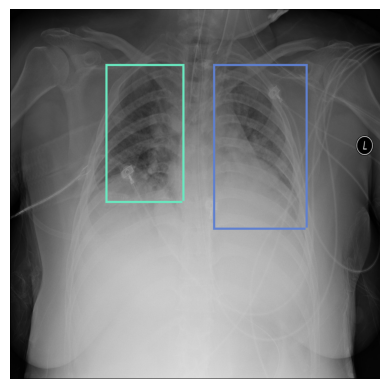

In [ ]:
draw(parsed['00436515-870c-4b36-a041-de91049b9ab4'])


As we can see in above image patient has pneumonia


The detection of bounding boxes consisting of a binary classification : the presence or absence of pneumonia.  

However, in addition to the binary classification, each bounding box without pneumonia is further categorized into *normal* or *no lung opacity / not normal*.

This extra third class indicates that while pneumonia was determined not to be present, there was some type of abnormality on the image, and sometimes this finding may mimic the appearance of true pneumonia.

This extra class is provided as supplemental information to help improve algorithm accuracy if needed; generation of this separate class In this project we will use only two target variables 0 and 1 i.e. normal and pnumonia respectively.

As we see above, the patient does not have pneumonia however does have another imaging abnormality present. Let's take a closer look:

In [ ]:
df_detailed = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_detailed_class_info.csv')
print(df_detailed.iloc[0])


patientId    0004cfab-14fd-4e49-80ba-63a80b6bddd6
class                No Lung Opacity / Not Normal
Name: 0, dtype: object


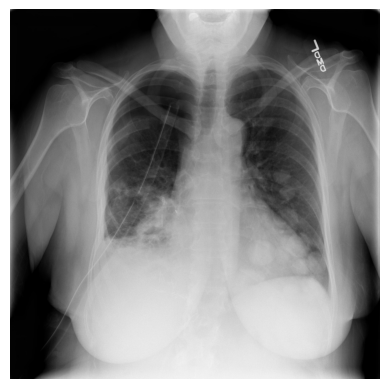

In [ ]:
patientId = df_detailed['patientId'][0]
draw(parsed[patientId])

From above image, it is clearly evident that the patient has several well circumscribed nodular densities in the left lung (right side of image). This can be because of lung cancer masses.

**Label Summary**<br>

Let us take a closer look at the distribution of labels in the dataset. To do so we will first parse the detailed label information:

In [ ]:
summary = {}
for n, row in df_detailed.iterrows():
    if row['class'] not in summary:
        summary[row['class']] = 0
    summary[row['class']] += 1

print(summary)

{'No Lung Opacity / Not Normal': 11821, 'Normal': 8851, 'Lung Opacity': 9555}


Therer are total=30227 records and three classes:-<br>
'No Lung Opacity / Not Normal': 11821, 39.04%<br>
'Normal': 8851, 29.2%
'Lung Opacity': 9555, 31.5% <br>
nearly 2/3rd of the data comprising of *no pneumonia* (either completely normal or no lung opacity / not normal).

Compared to most medical imaging datasets, where the prevalence of disease is quite low, this dataset has been significantly enriched with pathology.<br>

As we can see, there is a relatively even split between the three classes, with nearly 66% of the data comprising of no pneumonia (either completely normal or no lung opacity / not normal).


Before we move on with further EDA on the Metadata, let's have a look at some more images from the three categories to get a better understanding of the dataset.

In [ ]:
def show_dicom_image(data_df):
        img_data = list(data_df.T.to_dict().values())
        f, ax = plt.subplots(2,2, figsize=(16,18))
        for i,data_row in enumerate(img_data):
            pid = data_row['patientId']
            dcm_file = '/content/stage_2_train_images/%s.dcm' % pid
            dcm_data = pydicom.read_file(dcm_file)
            ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone)
            ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(
                data_row['patientId'],dcm_data.PatientAge, dcm_data.PatientSex))

In [ ]:
df_orig = df.copy()

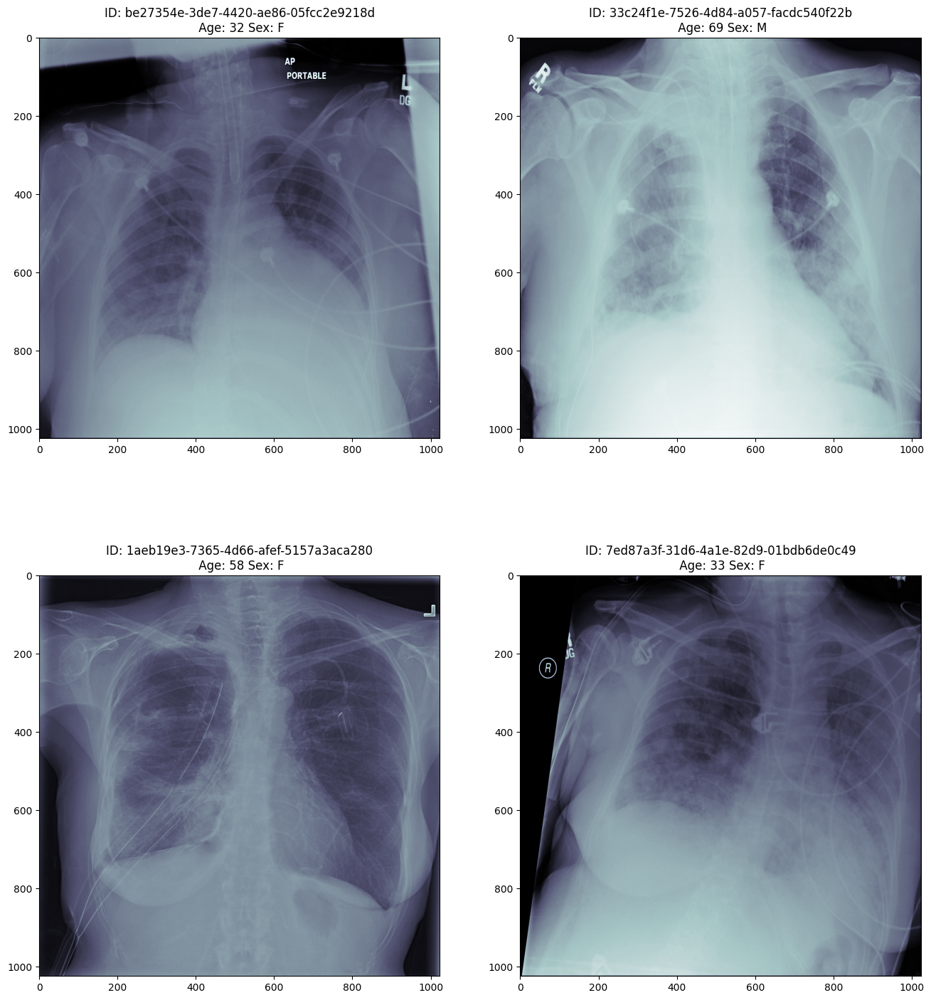

In [ ]:
df = pd.concat([df_orig,df_detailed["class"]],axis=1,sort=False)
show_dicom_image(df[df['Target']==1].sample(n=4))

Above is images of patients with pneumonia.

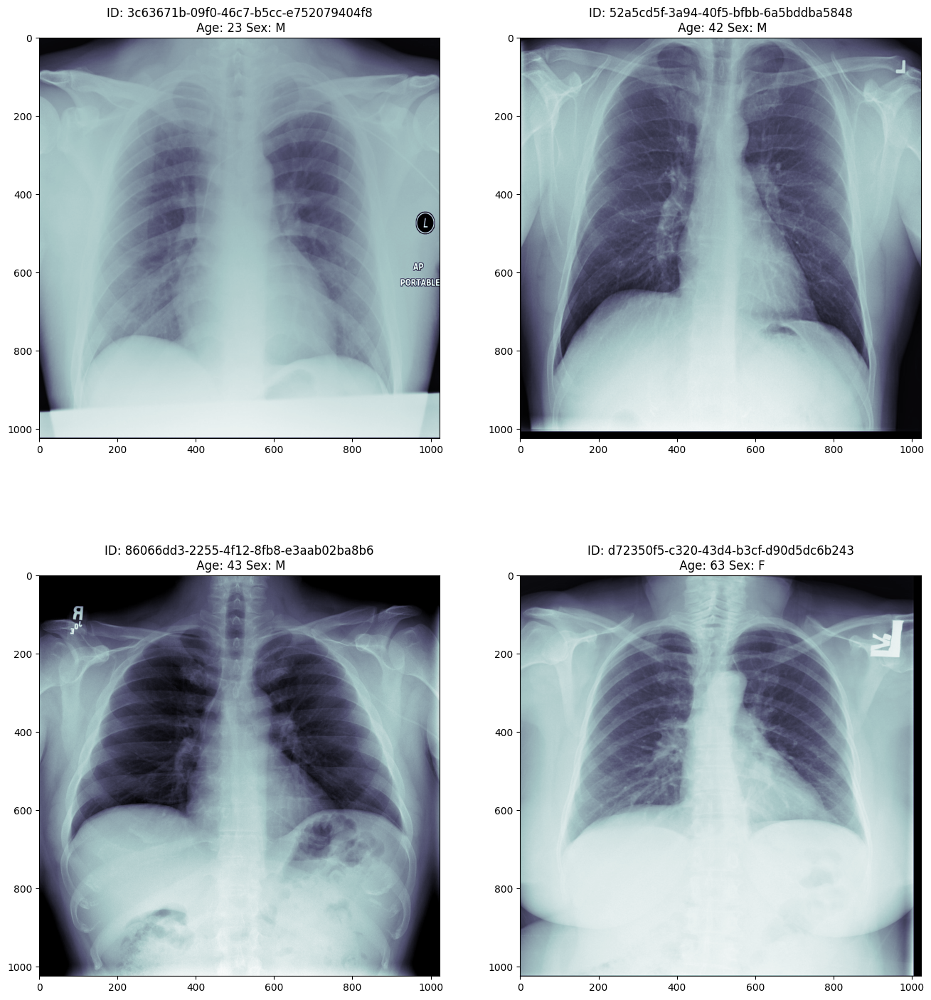

In [ ]:
show_dicom_image(df[ (df['Target']==0) & (df['class']=='Normal')].sample(n=4))


Above is images of patients with no pneumonia.

In [ ]:
def show_dicome_with_boundingbox(data_df):
    img_data = list(data_df.T.to_dict().values())
    f, ax = plt.subplots(2,2, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        pid = data_row['patientId']
        dcm_file = '/content/stage_2_train_images/%s.dcm' % pid
        dcm_data = pydicom.read_file(dcm_file)
        ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone)
        ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(
                data_row['patientId'],dcm_data.PatientAge, dcm_data.PatientSex))
        rows = data_df[data_df['patientId']==data_row['patientId']]
        box_data = list(rows.T.to_dict().values())
        for j, row in enumerate(box_data):
            x,y,width,height = row['x'], row['y'],row['width'],row['height']
            rectangle = Rectangle(xy=(x,y),width=width, height=height, color="red",alpha = 0.1)
            ax[i//2, i%2].add_patch(rectangle)

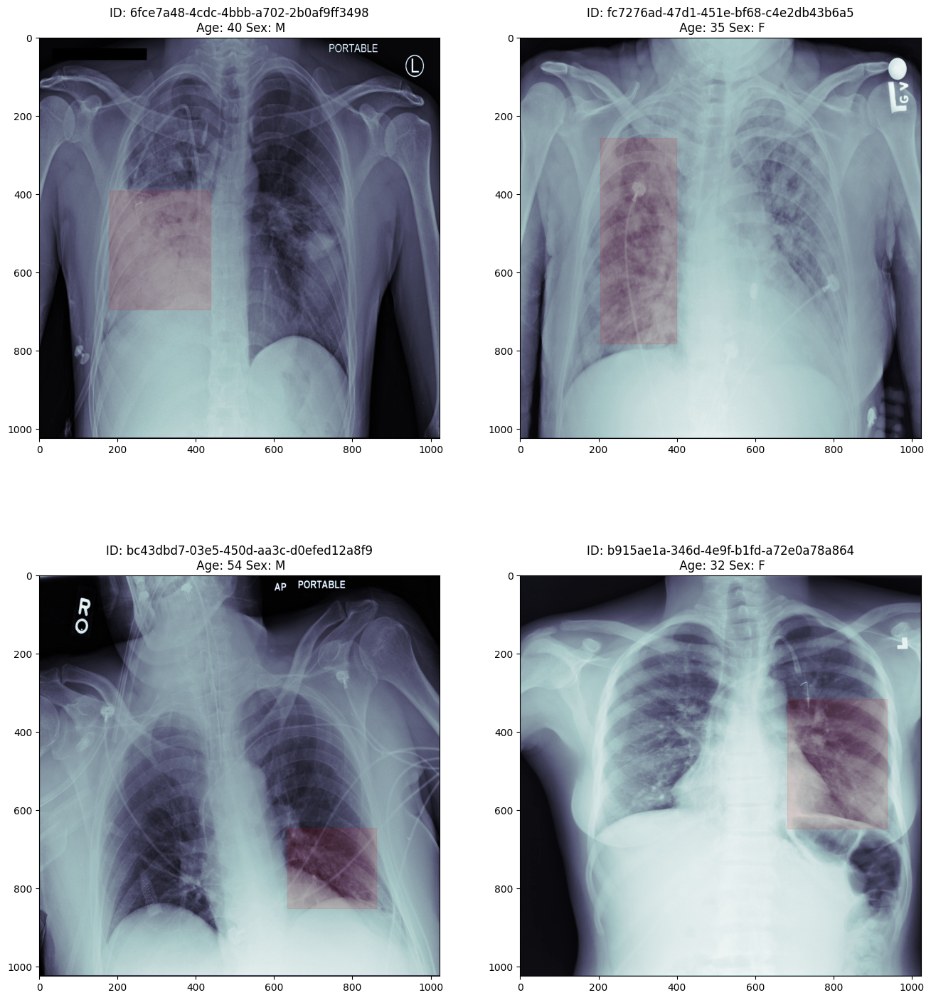

In [ ]:
show_dicome_with_boundingbox(df[df['Target']==1].sample(n=4))


Above are the images of patients with pneumonia along with bounding boxes

Now that we have a basic idea regarding the data and images, we can explore the metadata present in the dataset to see whether some information can be extracted directly from them. This will be extremely important since images will require deep learning based solutions which will take large amount of resources and time for coming up with efficient results, whereas analysing and extracting useful information from metadata is extremely fast and easy to do.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import gc

In [ ]:
detailed_class_info = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_detailed_class_info.csv')
train_labels = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_train_labels.csv')

df = pd.merge(left = detailed_class_info, right = train_labels, how = 'left', on = 'patientId')

del detailed_class_info, train_labels
gc.collect()

12930

In [ ]:
df.info(null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37629 entries, 0 to 37628
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  37629 non-null  object 
 1   class      37629 non-null  object 
 2   x          16957 non-null  float64
 3   y          16957 non-null  float64
 4   width      16957 non-null  float64
 5   height     16957 non-null  float64
 6   Target     37629 non-null  int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 2.3+ MB


As we can see, there are 37.6k patients' information. Out of these patients, only for 16.9k patients the bounding box coordinates are available meaning that there was no Pneumonia detected for the rest of the patients.

In [ ]:
df.head()

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1


In [ ]:
df.drop_duplicates(inplace=True)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30227 entries, 0 to 37626
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   class      30227 non-null  object 
 2   x          9555 non-null   float64
 3   y          9555 non-null   float64
 4   width      9555 non-null   float64
 5   height     9555 non-null   float64
 6   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 1.8+ MB


We are now left with data for 30.2k unique patients. Out of these only 9.5k patients have pneumonia.

**we know that it's possible to have multiple bounding boxes in an image corresponding to a patient.**

In [ ]:
df['patientId'].value_counts().head(10)


3239951b-6211-4290-b237-3d9ad17176db    4
31764d54-ea3b-434f-bae2-8c579ed13799    4
1c44e0a4-4612-438f-9a83-8d5bf919cb67    4
8dc8e54b-5b05-4dac-80b9-fa48878621e2    4
349f10b4-dc3e-4f3f-b2e4-a5b81448ce87    4
76f71a93-8105-4c79-a010-0cfa86f0061a    4
0d5bc737-03de-4bb8-98a1-45b7180c3e0f    4
32408669-c137-4e8d-bd62-fe8345b40e73    4
7d674c82-5501-4730-92c5-d241fd6911e7    4
0ab261f9-4eb5-42ab-a9a5-e918904d6356    4
Name: patientId, dtype: int64

Let's a see sample of this data for the patient id - 32408669-c137-4e8d-bd62-fe8345b40e73

In [ ]:
df[df['patientId'] == '32408669-c137-4e8d-bd62-fe8345b40e73']


,patientId,class,x,y,width,height,Target
3433,32408669-c137-4e8d-bd62-fe8345b40e73,Lung Opacity,273.0,856.0,234.0,101.0,1
3434,32408669-c137-4e8d-bd62-fe8345b40e73,Lung Opacity,702.0,801.0,249.0,144.0,1
3435,32408669-c137-4e8d-bd62-fe8345b40e73,Lung Opacity,300.0,367.0,226.0,423.0,1
3436,32408669-c137-4e8d-bd62-fe8345b40e73,Lung Opacity,706.0,360.0,232.0,238.0,1


As we can see, this patient's chest x-ray image has 4 bounding boxes.

Let's see the distribution of number of bounding boxes in patients' x-ray images.

In [ ]:
df['patientId'].value_counts().value_counts()


1    23286
2     3266
3      119
4       13
Name: patientId, dtype: int64

We know that a patient *No-Pneumonia* will have only one row (0 bounding boxes). Let's see how many such cases are there.

In [ ]:
df[df['Target'] == 0]['patientId'].value_counts().value_counts()


1    20672
Name: patientId, dtype: int64

As we can see here, most of the patients have no pneumonia. But this also means that there are some other cases as well. Let's explore the same.

In [ ]:
df[df['Target'] == 1]['patientId'].value_counts().value_counts()


2    3266
1    2614
3     119
4      13
Name: patientId, dtype: int64

Notice that even for patients with pneumonia, there are 2614 patients which have only one row.

let's have a look at the distribution of the target class.

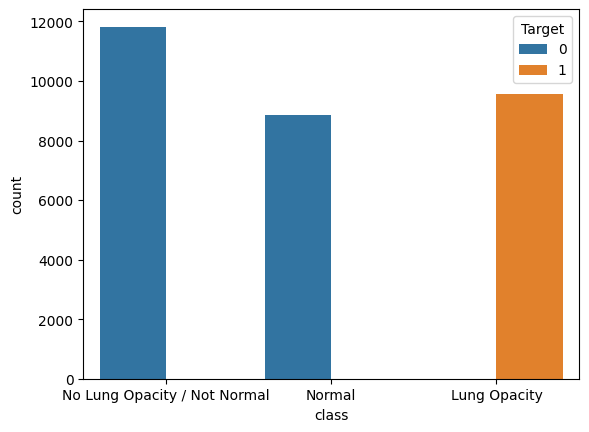

In [ ]:
sns.countplot(x = 'class', hue = 'Target', data = df)
plt.show()

most of the images are from the class No Lung Opacity/Not Normal or Normal class<br>
Let's have a look at the target distribution for these classes. Again,

Lung Opacity - 1<br>
Normal Class - 0<br>
No Lung Opacity/Not Normal - 0<br>

In [ ]:
df[df['class'] == 'Lung Opacity']['Target'].value_counts(dropna = False)


1    9555
Name: Target, dtype: int64

In [ ]:
df[df['class'] == 'No Lung Opacity / Not Normal']['Target'].value_counts(dropna = False)


0    11821
Name: Target, dtype: int64

In [ ]:
df[df['class'] == 'Normal']['Target'].value_counts(dropna = False)

0    8851
Name: Target, dtype: int64

In [ ]:
def get_feature_distribution(data, feature):
    # Get the count for each label
    label_counts = data[feature].value_counts()

    # Get total number of samples
    total_samples = len(data)

    # Count the number of items in each class
    print("Feature: {}".format(feature))
    for i in range(len(label_counts)):
        label = label_counts.index[i]
        count = label_counts.values[i]
        percent = int((count / total_samples) * 10000) / 100
        print("{:<30s}:   {} or {}%".format(label, count, percent))

get_feature_distribution(df, 'class')

Feature: class
No Lung Opacity / Not Normal  :   11821 or 39.1%
Lung Opacity                  :   9555 or 31.61%
Normal                        :   8851 or 29.28%


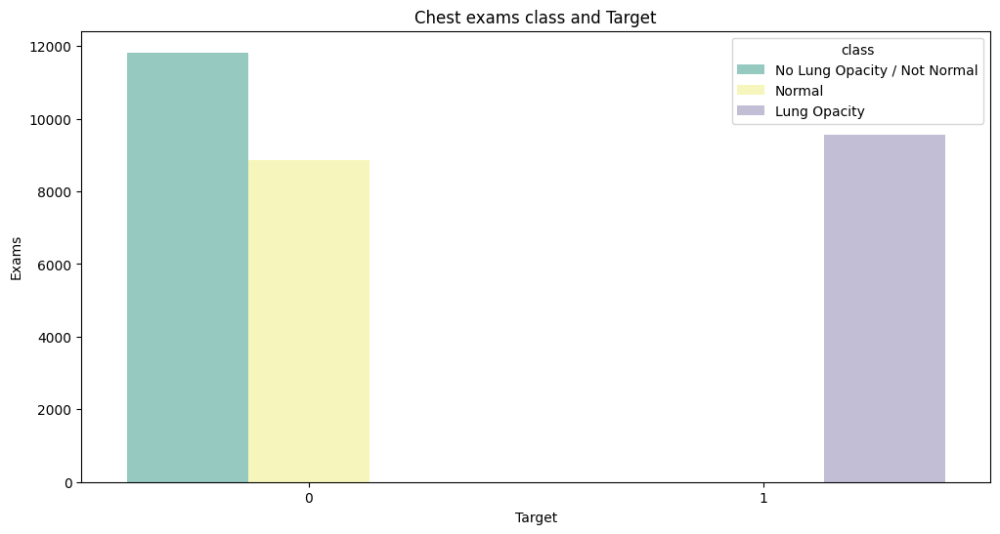

In [ ]:
fig, ax = plt.subplots(nrows=1,figsize=(12,6))
tmp = df.groupby('Target')['class'].value_counts()
data = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
sns.barplot(ax=ax,x = 'Target', y='Exams',hue='class',data=data, palette='Set3')
plt.title("Chest exams class and Target")
plt.show()

All chest examinations withTarget = 1 (pathology detected) associated with class: Lung Opacity.

The chest examinations with Target = 0 (no pathology detected) are either of class: Normal or class: No Lung Opacity / Not Normal.

checking for missing data

In [ ]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return np.transpose(pd.concat([total, percent], axis=1, keys=['Total', 'Percent']))
missing_data(df)

,x,y,width,height,patientId,class,Target
Total,20672.000000,20672.000000,20672.000000,20672.000000,0.0,0.0,0.0
Percent,68.389188,68.389188,68.389188,68.389188,0.0,0.0,0.0


The percent missing for x,y, height and width in train labels represents the percent of the target 0 (not Lung opacity).

Detecting Lung Opacity window

For the class Lung Opacity, corresponding to values of Target = 1, we plot the density of x, y, width and height.

<Figure size 640x480 with 0 Axes>

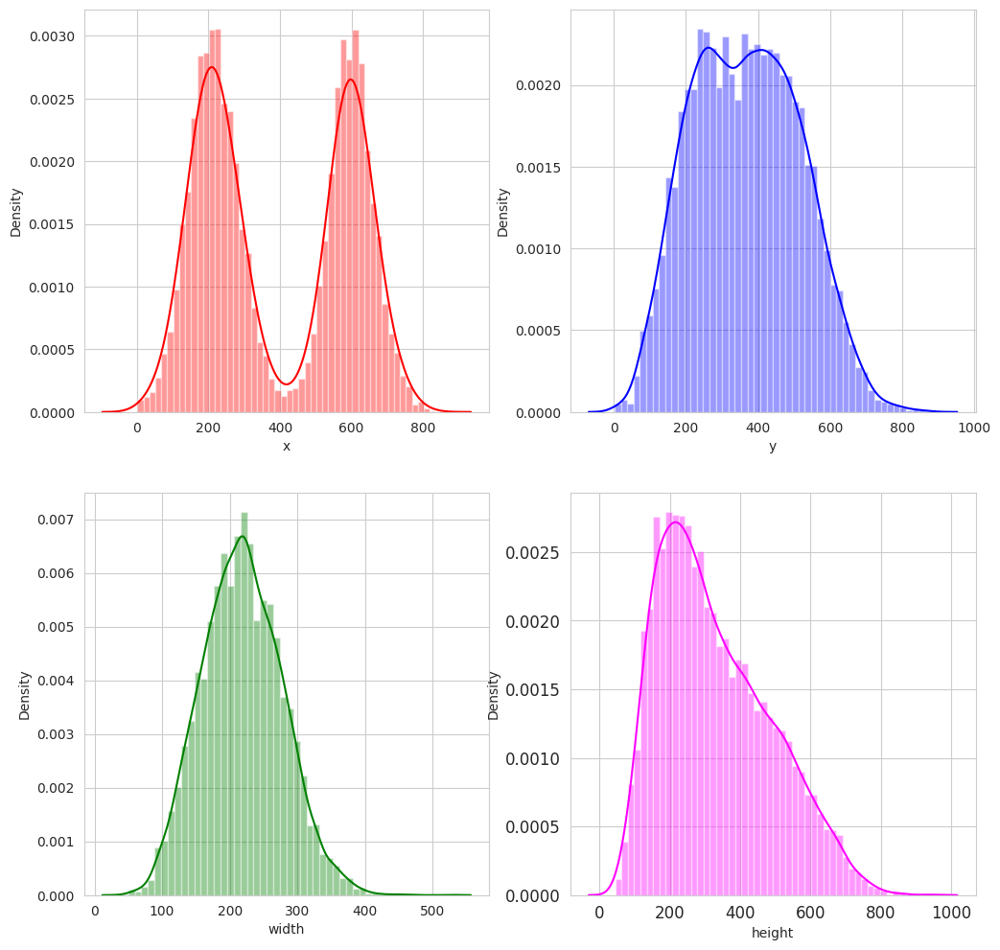

In [ ]:
target1 = df[df['Target']==1]
sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(2,2,figsize=(12,12))
sns.distplot(target1['x'],kde=True,bins=50, color="red", ax=ax[0,0])
sns.distplot(target1['y'],kde=True,bins=50, color="blue", ax=ax[0,1])
sns.distplot(target1['width'],kde=True,bins=50, color="green", ax=ax[1,0])
sns.distplot(target1['height'],kde=True,bins=50, color="magenta", ax=ax[1,1])
locs, labels = plt.xticks()
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

We can plot also the center of the rectangles points in the plane x0y.

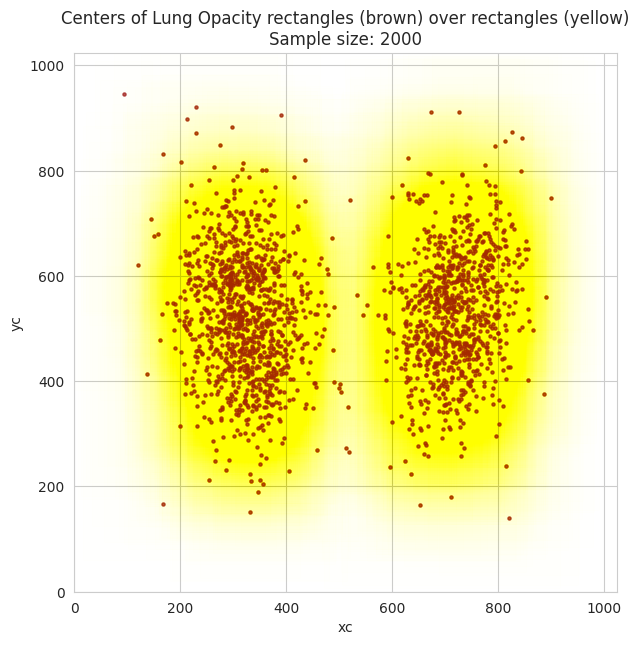

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(7,7))
target_sample = target1.sample(2000)
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2
plt.title("Centers of Lung Opacity rectangles (brown) over rectangles (yellow)\nSample size: 2000")
target_sample.plot.scatter(x='xc', y='yc', xlim=(0,1024), ylim=(0,1024), ax=ax, alpha=0.8, marker=".", color="brown")
for i, crt_sample in target_sample.iterrows():
    ax.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color="yellow"))
plt.show()

  checking  distribution accross classes and Target value.

In [ ]:
tmp = df.groupby(['patientId','Target', 'class'])['patientId'].count()
df1 = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
tmp = df1.groupby(['Exams','Target','class']).count()
df2 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()
df2.columns = ['Exams', 'Target','Class', 'Entries']
df2

,Exams,Target,Class,Entries
0,1,0,No Lung Opacity / Not Normal,11821
1,1,0,Normal,8851
2,1,1,Lung Opacity,2614
3,2,1,Lung Opacity,3266
4,3,1,Lung Opacity,119
5,4,1,Lung Opacity,13


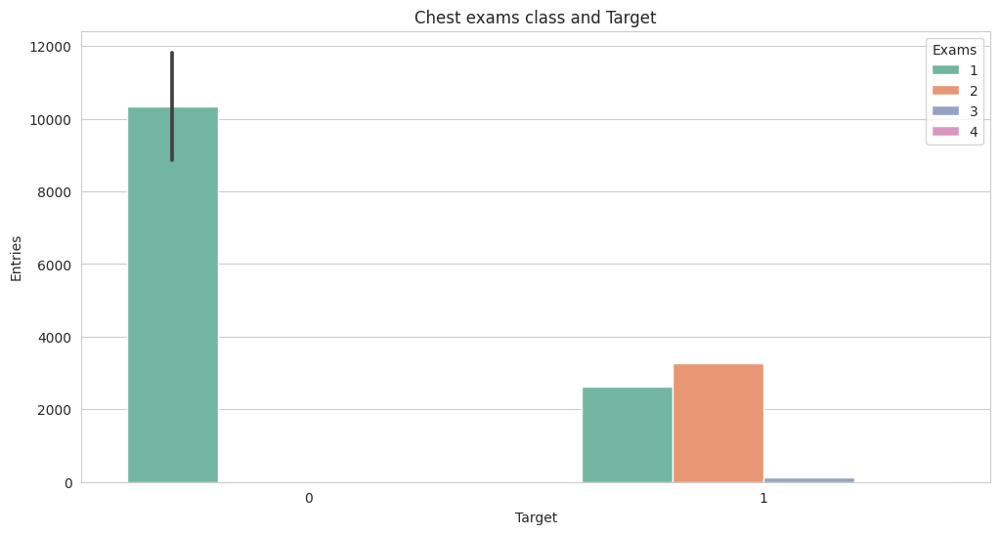

In [ ]:
fig, ax = plt.subplots(nrows=1,figsize=(12,6))
sns.barplot(ax=ax,x = 'Target', y='Entries', hue='Exams',data=df2, palette='Set2')
plt.title("Chest exams class and Target")
plt.show()

mostly its one exam. 4 exams is very rare

using the metadata we have, we will create some new features regarding the bounding box.

x_2, y_2 - Corner point coordinates opposite to x, y


area - Area of the bounding box


x_center, y_center - Center point of the bounding box

In [ ]:
df_areas = df.dropna()[['x', 'y', 'width', 'height']].copy()
df_areas['x_2'] = df_areas['x'] + df_areas['width']
df_areas['y_2'] = df_areas['y'] + df_areas['height']
df_areas['x_center'] = df_areas['x'] + df_areas['width'] / 2
df_areas['y_center'] = df_areas['y'] + df_areas['height'] / 2
df_areas['area'] = df_areas['width'] * df_areas['height']
def iou_loss(y_true, y_pred):
    y_true=tf.cast(y_true, tf.float32)
    y_pred=tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model
df_areas.head()

,x,y,width,height,x_2,y_2,x_center,y_center,area
4,264.0,152.0,213.0,379.0,477.0,531.0,370.5,341.5,80727.0
5,562.0,152.0,256.0,453.0,818.0,605.0,690.0,378.5,115968.0
10,323.0,577.0,160.0,104.0,483.0,681.0,403.0,629.0,16640.0
11,695.0,575.0,162.0,137.0,857.0,712.0,776.0,643.5,22194.0
18,288.0,322.0,94.0,135.0,382.0,457.0,335.0,389.5,12690.0


In [ ]:
def createJointplot(df, x, y):
    sns.jointplot(x = x, y = y, data = df, kind = 'hex', gridsize = 20)
    plt.show()

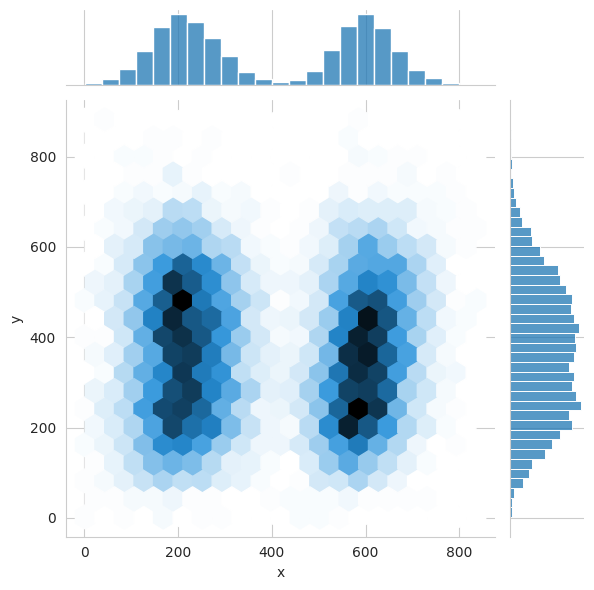

In [ ]:
createJointplot(df_areas,'x','y')


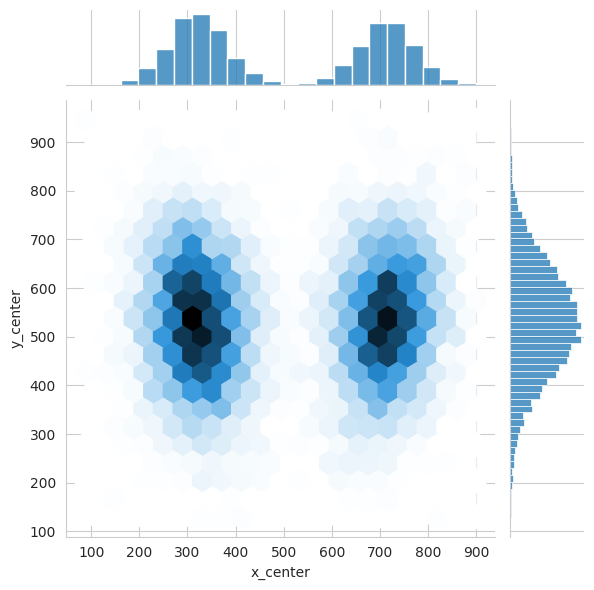

In [ ]:
createJointplot(df_areas,'x_center','y_center')


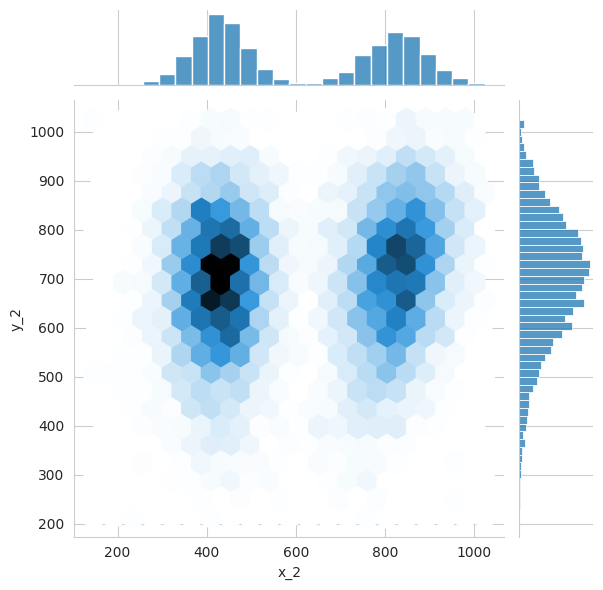

In [ ]:
createJointplot(df_areas,'x_2','y_2')


there is no significant correlation between the points (x,y) and (x_2, y_2). Let's also study the correlation between width and height.

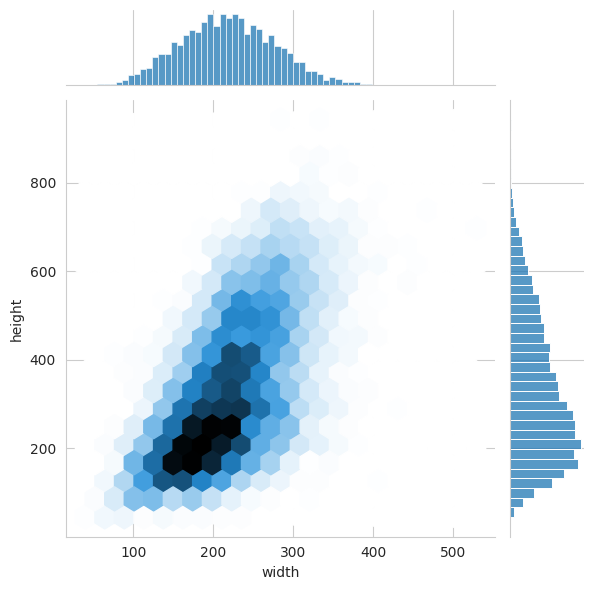

In [ ]:
createJointplot(df_areas,'width','height')


from the above joint plot, width and height have high correlation, so while building a model, we can choose to keep only one of the 2 for increasing the simplicity of the model.

**Outlier Analysis**<br>
we will use boxplots to see whether there are any outliers in the features.

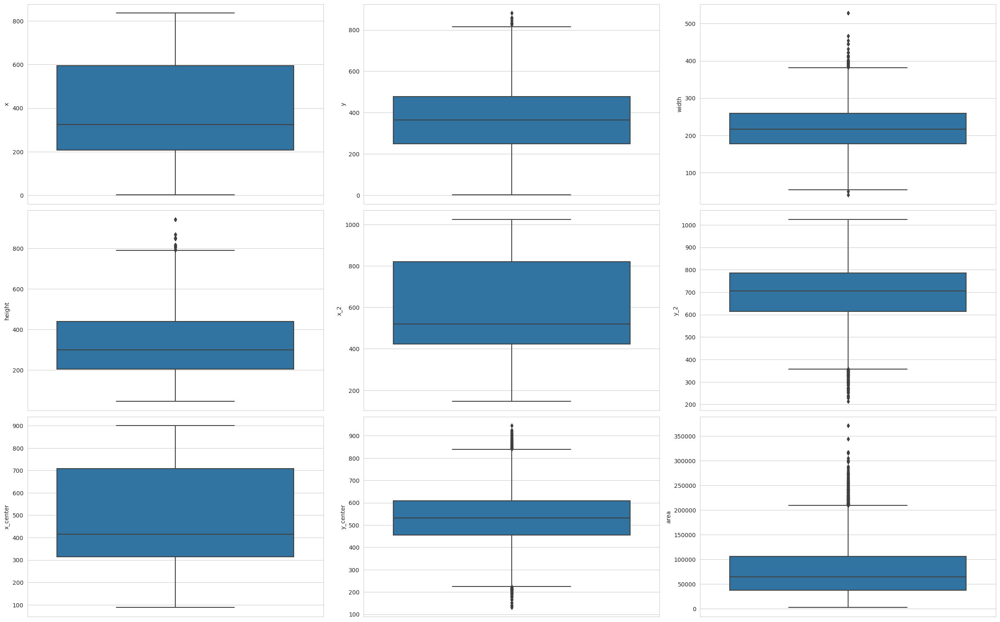

In [ ]:
n_columns = 3
n_rows = 3
_, axes = plt.subplots(n_rows, n_columns, figsize=(8 * n_columns, 5 * n_rows))
for i, c in enumerate(df_areas.columns):
    sns.boxplot(y = c, data = df_areas, ax = axes[i // n_columns, i % n_columns])
plt.tight_layout()
plt.show()

There are some outliers in the width and height features. Let's find the rows where these values exist

In [ ]:
df_areas[df_areas['width'] > 500]

,x,y,width,height,x_2,y_2,x_center,y_center,area
928,226.0,189.0,528.0,703.0,754.0,892.0,490.0,540.5,371184.0


In [ ]:
pid_width = list(df[df['width'] > 500]['patientId'].values)
df[df['patientId'].isin(pid_width)]

,patientId,class,x,y,width,height,Target
928,097788d4-cb88-4457-8e71-0ca7a3da2216,Lung Opacity,226.0,189.0,528.0,703.0,1


In [ ]:
df_areas[df_areas['height'] > 900].shape[0]

2

In [ ]:
pid_height = list(df[df['height'] > 900]['patientId'].values)
df[df['patientId'].isin(pid_height)]

,patientId,class,x,y,width,height,Target
5791,3ca6661a-ffbd-4d4d-b49b-c96cfd218307,Lung Opacity,87.0,104.0,310.0,793.0,1
5792,3ca6661a-ffbd-4d4d-b49b-c96cfd218307,Lung Opacity,549.0,82.0,280.0,942.0,1
6185,3e62e51c-befb-4a66-b28e-fc469b19e4a8,Lung Opacity,148.0,87.0,366.0,867.0,1
6186,3e62e51c-befb-4a66-b28e-fc469b19e4a8,Lung Opacity,620.0,82.0,335.0,942.0,1


Let's drop all these rows for the 2 patients. This will remove the extreme outliers.

In [ ]:
df = df[~df['patientId'].isin(pid_width + pid_height)]
df.shape

(30222, 7)

We are now left with around 30222 patients.

**Metadata Cleanup**

Let's clean up the entire metadata to keep only the relevant columns. We will use the cleaned up data to see whether there is any correlation between the target column and other columns.

In [ ]:
df_meta = df.drop('class', axis = 1).copy()
dcm_columns = None

for n, pid in enumerate(df_meta['patientId'].unique()):
    if n%1000==0:
        print(n,len(df_meta['patientId'].unique()))
    dcm_file = '/content/stage_2_train_images/%s.dcm' % pid
    dcm_data = pydicom.read_file(dcm_file)

    if not dcm_columns:
        dcm_columns = dcm_data.dir()
        dcm_columns.remove('PixelSpacing')
        dcm_columns.remove('PixelData')
    for col in dcm_columns:
        if not (col in df_meta.columns):
            df_meta[col] = np.nan
        index = df_meta[df_meta['patientId'] == pid].index
        df_meta.loc[df_meta[df_meta['patientId'] == pid].index,col] = str(dcm_data.data_element(col).value)

    del dcm_data

gc.collect()

0 26681
1000 26681
2000 26681
3000 26681
4000 26681
5000 26681
6000 26681
7000 26681
8000 26681
9000 26681
10000 26681
11000 26681
12000 26681
13000 26681
14000 26681
15000 26681
16000 26681
17000 26681
18000 26681
19000 26681
20000 26681
21000 26681
22000 26681
23000 26681
24000 26681
25000 26681
26000 26681


25984

In [ ]:
df_meta.columns

Index(['patientId', 'x', 'y', 'width', 'height', 'Target', 'AccessionNumber',
       'BitsAllocated', 'BitsStored', 'BodyPartExamined', 'Columns',
       'ConversionType', 'HighBit', 'InstanceNumber', 'LossyImageCompression',
       'LossyImageCompressionMethod', 'Modality', 'PatientAge',
       'PatientBirthDate', 'PatientID', 'PatientName', 'PatientOrientation',
       'PatientSex', 'PhotometricInterpretation', 'PixelRepresentation',
       'ReferringPhysicianName', 'Rows', 'SOPClassUID', 'SOPInstanceUID',
       'SamplesPerPixel', 'SeriesDescription', 'SeriesInstanceUID',
       'SeriesNumber', 'SpecificCharacterSet', 'StudyDate', 'StudyID',
       'StudyInstanceUID', 'StudyTime', 'ViewPosition'],
      dtype='object')

In [ ]:
df_meta.loc[0,'PatientName']='0004cfab-14fd-4e49-80ba-63a80b6bddd6'

In [ ]:
to_drop = df_meta.nunique()
to_drop = to_drop[(to_drop <= 1) | (to_drop == to_drop['patientId'])].index
to_drop = to_drop.drop('patientId')


In [ ]:
df_meta.drop(to_drop, axis = 1, inplace = True)



In [ ]:
df_meta.head()

,patientId,x,y,width,height,Target,PatientAge,PatientSex,SeriesDescription,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,51,F,view: PA,PA
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,48,F,view: PA,PA
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,19,M,view: AP,AP
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,28,M,view: PA,PA
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,32,F,view: AP,AP


In [ ]:
vars = ['Modality', 'PatientAge', 'PatientSex', 'BodyPartExamined', 'ViewPosition', 'ConversionType', 'Rows', 'Columns', 'PixelSpacing']
from tqdm import tqdm_notebook
import pydicom as dcm


def process_dicom_data(data_df, data_path):
    for var in vars:
        data_df[var] = None
    image_names = os.listdir(data_path)
    for i, img_name in tqdm_notebook(enumerate(image_names)):
        imagePath = os.path.join(data_path,img_name)
        data_row_img_data = dcm.read_file(imagePath)
        idx = (data_df['patientId']==data_row_img_data.PatientID)
        data_df.loc[idx,'Modality'] = data_row_img_data.Modality
        data_df.loc[idx,'PatientAge'] = pd.to_numeric(data_row_img_data.PatientAge)
        data_df.loc[idx,'PatientSex'] = data_row_img_data.PatientSex
        data_df.loc[idx,'BodyPartExamined'] = data_row_img_data.BodyPartExamined
        data_df.loc[idx,'ViewPosition'] = data_row_img_data.ViewPosition
        data_df.loc[idx,'ConversionType'] = data_row_img_data.ConversionType
        data_df.loc[idx,'Rows'] = data_row_img_data.Rows
        data_df.loc[idx,'Columns'] = data_row_img_data.Columns
        data_df.loc[idx,'PixelSpacing'] = str.format("{:4.3f}",data_row_img_data.PixelSpacing[0])

In [ ]:
process_dicom_data(df,'/content/stage_2_train_images/')

0it [00:00, ?it/s]

In [ ]:
test_df = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_sample_submission.csv')

In [ ]:
test_df = test_df.drop('PredictionString',1)
process_dicom_data(test_df,'stage_2_test_images/')

0it [00:00, ?it/s]

Modality

 checking how many modalities are used in both train and test set.

In [ ]:
print("Modalities: train:",df['Modality'].unique(), "test:", test_df['Modality'].unique())

Modalities: train: ['CR'] test: ['CR']


The meaning of this modality is CR - Computer Radiography

Body Part Examined

checking if other body parts than 'CHEST' appears in the data.

In [ ]:
print("Body Part Examined: train:",df['BodyPartExamined'].unique(), "test:", test_df['BodyPartExamined'].unique())

Body Part Examined: train: ['CHEST'] test: ['CHEST']


View Position

View Position is a radiographic view associated with the Patient Position.

In [ ]:
print("View Position: train:",df['ViewPosition'].unique(), "test:", test_df['ViewPosition'].unique())

View Position: train: ['PA' 'AP'] test: ['PA' 'AP']


In [ ]:
get_feature_distribution(df,'ViewPosition')

Feature: ViewPosition
AP                            :   15292 or 50.59%
PA                            :   14930 or 49.4%


Both AP and PA body positions are present in the data. The meaning of these view positions are:

AP - Anterior/Posterior;
PA - Posterior/Anterior.

checking for the training data presenting Lung Opacity and the distribution of the window for both View Positions creating a  function to represent the distribution of the window centers and windows.

In [ ]:
def plot_window(data,color_point, color_window,text):
    fig, ax = plt.subplots(1,1,figsize=(7,7))
    plt.title("Centers of Lung Opacity rectangles over rectangles\n{}".format(text))
    data.plot.scatter(x='xc', y='yc', xlim=(0,1024), ylim=(0,1024), ax=ax, alpha=0.8, marker=".", color=color_point)
    for i, crt_sample in data.iterrows():
        ax.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
            width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color=color_window))
    plt.show()

sample subset of the train data with Target = 1.  We then select from this sample the data with the two view position, to plot the window distribution separately.

In [ ]:
target1 = df[df['Target']==1]

target_sample = target1.sample(2000)
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2

target_ap = target_sample[target_sample['ViewPosition']=='AP']
target_pa = target_sample[target_sample['ViewPosition']=='PA']

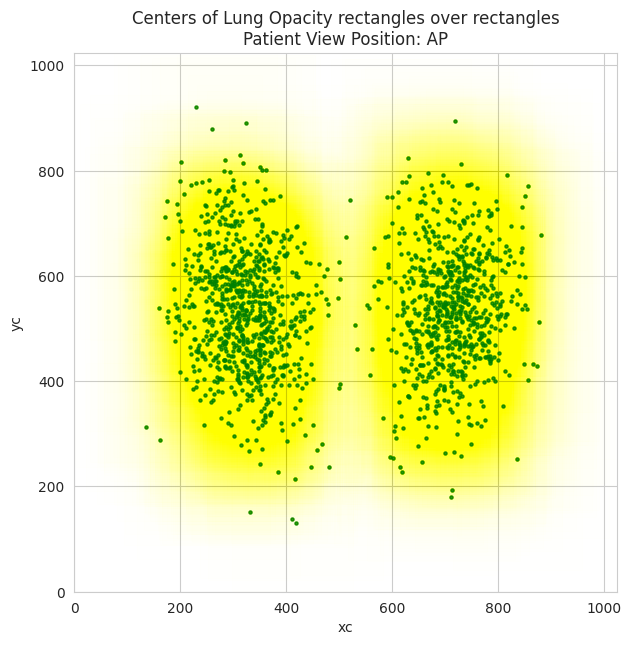

In [ ]:
plot_window(target_ap,'green', 'yellow', 'Patient View Position: AP')

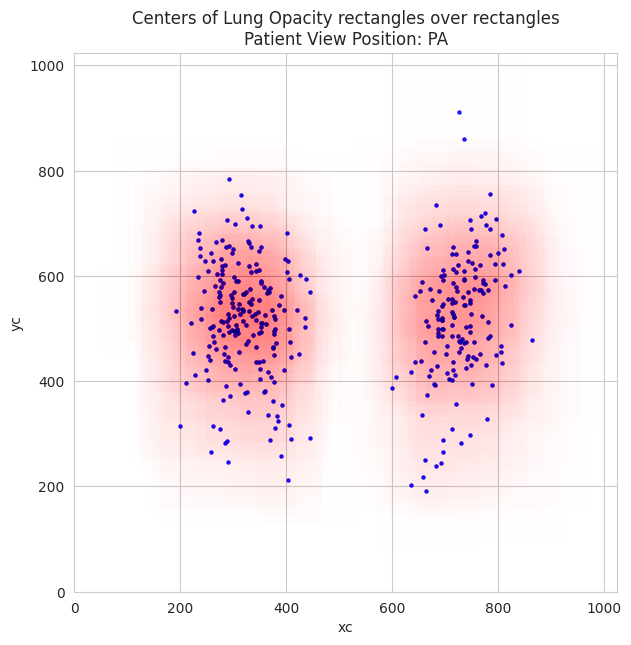

In [ ]:
plot_window(target_pa,'blue', 'red', 'Patient View Position: PA')

checking the distribution of AP and PA positions for the test set.

In [ ]:
get_feature_distribution(test_df,'ViewPosition')

Feature: ViewPosition
PA                            :   1618 or 53.93%
AP                            :   1382 or 46.06%


Patient Age

examining now the data for the Patient Age for the train set.

In [ ]:
tmp = df.groupby(['Target', 'PatientAge'])['patientId'].count()
df1 = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
tmp = df1.groupby(['Exams','Target', 'PatientAge']).count()
df2 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()


In [ ]:
tmp = df.groupby(['class', 'PatientAge'])['patientId'].count()
df4 = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
tmp = df4.groupby(['Exams','class', 'PatientAge']).count()
df3 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()

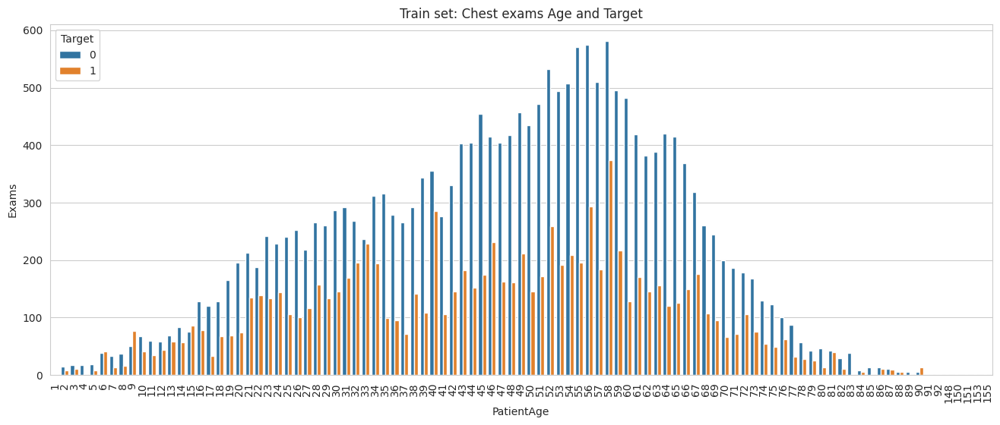

In [ ]:
fig, (ax) = plt.subplots(nrows=1,figsize=(16,6))
sns.barplot(ax=ax, x = 'PatientAge', y='Exams', hue='Target',data=df2)
plt.title("Train set: Chest exams Age and Target")
plt.xticks(rotation=90)
plt.show()

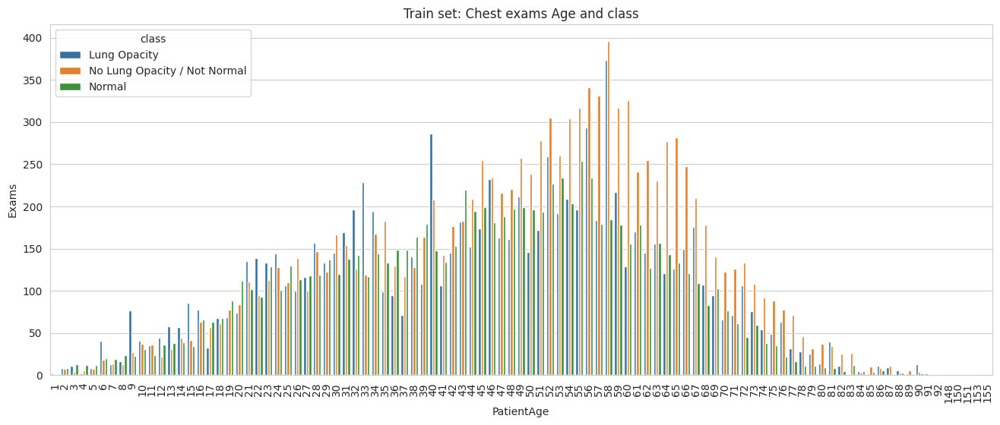

In [ ]:
fig, (ax) = plt.subplots(nrows=1,figsize=(16,6))
sns.barplot(ax=ax, x = 'PatientAge', y='Exams', hue='class',data=df3)
plt.title("Train set: Chest exams Age and class")
plt.xticks(rotation=90)
plt.show()

most probably, the values of age 148 to 155 are mistakes.


 grouping the ages in 5 groups (0-19, 20-34, 35-49, 50-64 and 65+).

In [ ]:
target_age1 = target_sample[target_sample['PatientAge'] < 20]
target_age2 = target_sample[(target_sample['PatientAge'] >=20) & (target_sample['PatientAge'] < 35)]
target_age3 = target_sample[(target_sample['PatientAge'] >=35) & (target_sample['PatientAge'] < 50)]
target_age4 = target_sample[(target_sample['PatientAge'] >=50) & (target_sample['PatientAge'] < 65)]
target_age5 = target_sample[target_sample['PatientAge'] >= 65]

showing the distribution of windows for the 5 age groups.


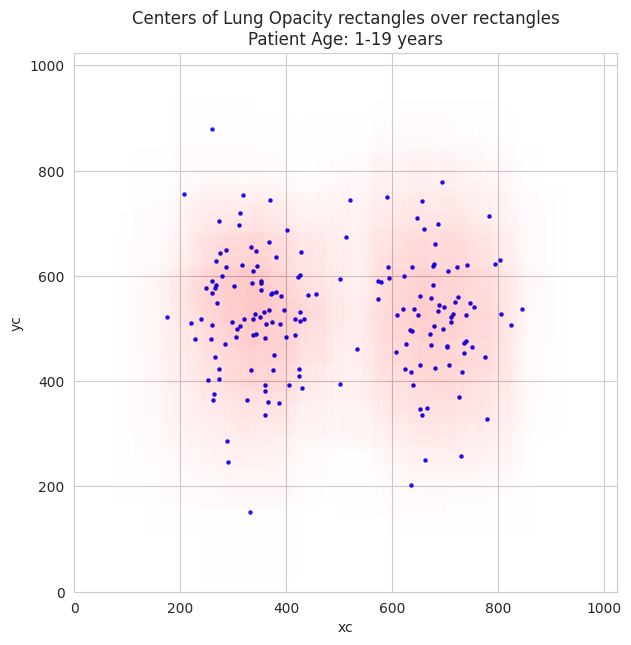

In [ ]:
plot_window(target_age1,'blue', 'red', 'Patient Age: 1-19 years')

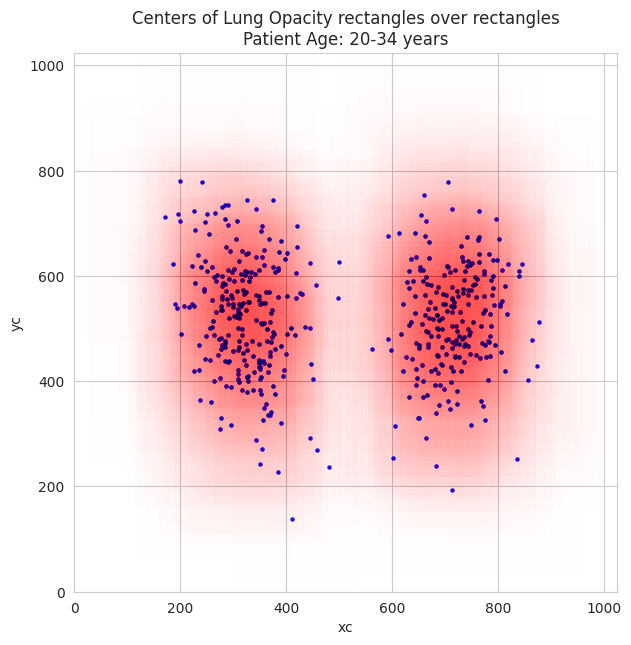

In [ ]:
plot_window(target_age2,'blue', 'red', 'Patient Age: 20-34 years')

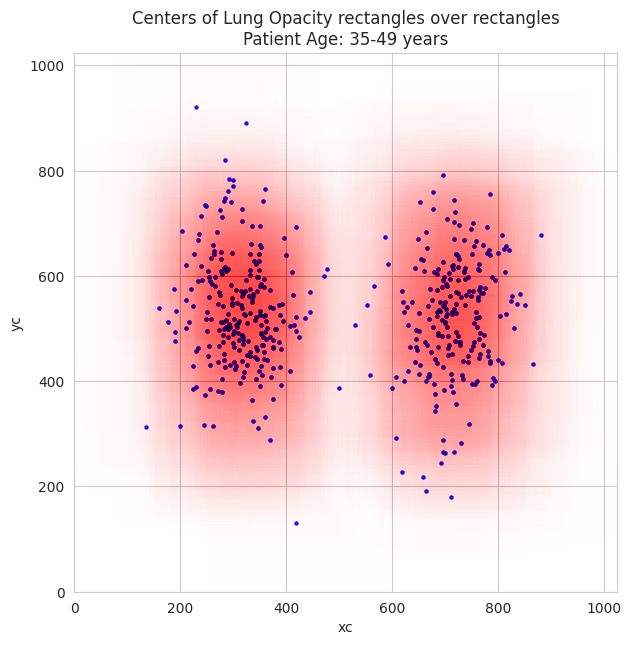

In [ ]:
plot_window(target_age3,'blue', 'red', 'Patient Age: 35-49 years')

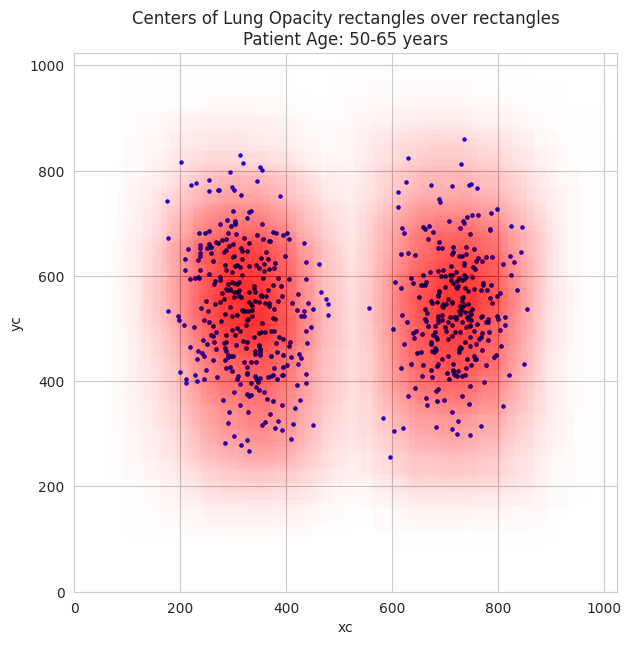

In [ ]:
plot_window(target_age4,'blue', 'red', 'Patient Age: 50-65 years')

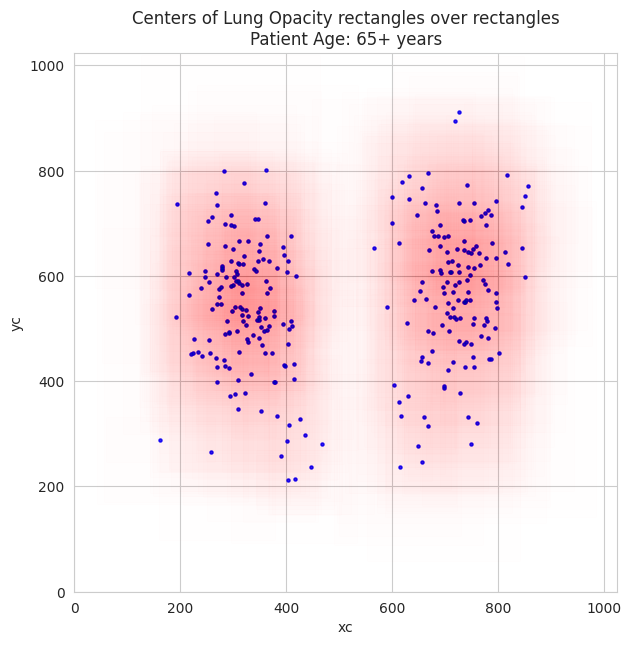

In [ ]:
plot_window(target_age5,'blue', 'red', 'Patient Age: 65+ years')


the distribution is less in the age group of 1-19 years and keeps increasing and it is highest in the age group of 35-49 and 50-65. in older people it is getting sparse

### comparision between distribution of disease between male and female

comparison with patients with and without pneumonia

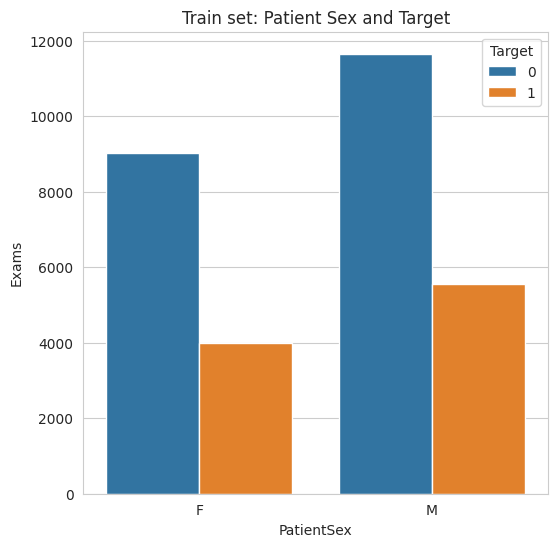

In [ ]:
tmp = df.groupby(['Target', 'PatientSex'])['patientId'].count()
df1 = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
tmp = df1.groupby(['Exams','Target', 'PatientSex']).count()
df2 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()
fig, ax = plt.subplots(nrows=1,figsize=(6,6))
sns.barplot(ax=ax, x = 'PatientSex', y='Exams', hue='Target',data=df2)
plt.title("Train set: Patient Sex and Target")
plt.show()

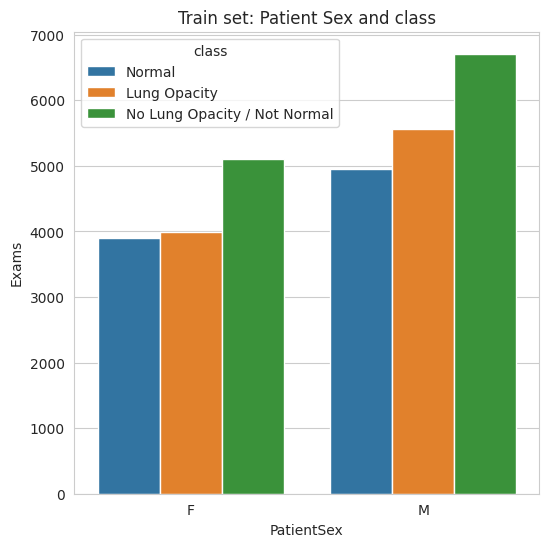

In [ ]:
tmp = df.groupby(['class', 'PatientSex'])['patientId'].count()
df1 = pd.DataFrame(data={'Exams': tmp.values}, index=tmp.index).reset_index()
tmp = df1.groupby(['Exams','class', 'PatientSex']).count()
df3 = pd.DataFrame(data=tmp.values, index=tmp.index).reset_index()
fig, (ax) = plt.subplots(nrows=1,figsize=(6,6))
sns.barplot(ax=ax, x = 'PatientSex', y='Exams', hue='class',data=df3)
plt.title("Train set: Patient Sex and class")
plt.show()


Let's plot as well the distribution of window with Lung Opacity, separatelly for the female and male patients. We will reuse the sample with Target = 1 for which we calculated also the center of the window.

In [ ]:
target_female = target_sample[target_sample['PatientSex']=='F']
target_male = target_sample[target_sample['PatientSex']=='M']

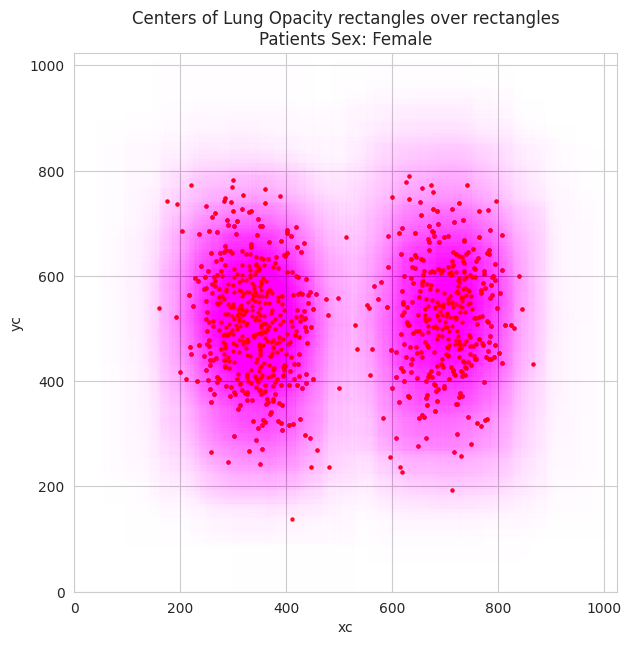

In [ ]:
plot_window(target_female,"red", "magenta","Patients Sex: Female")

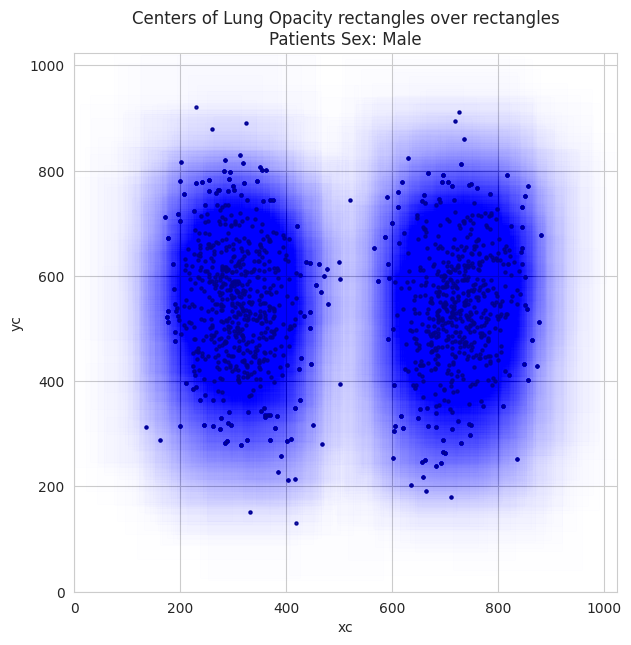

In [ ]:
plot_window(target_male,"darkblue", "blue", "Patients Sex: Male")

the distributions seems to be denser for males compared to females

In [ ]:
df_meta['PatientAge'] = df_meta['PatientAge'].astype(int)
df_meta['SeriesDescription'] = df_meta['SeriesDescription'].map({'view: AP': 'AP', 'view: PA': 'PA'})

df_meta.drop('SeriesDescription', axis = 1, inplace = True)

df_meta['PatientSex'] = df_meta['PatientSex'].map({'F': 0, 'M': 1})
df_meta['ViewPosition'] = df_meta['ViewPosition'].map({'PA': 0, 'AP': 1})
df_meta.head()

,patientId,x,y,width,height,Target,PatientAge,PatientSex,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,51,0,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,48,0,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,19,1,1
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,28,1,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,32,0,1


<Axes: xlabel='ViewPosition', ylabel='count'>

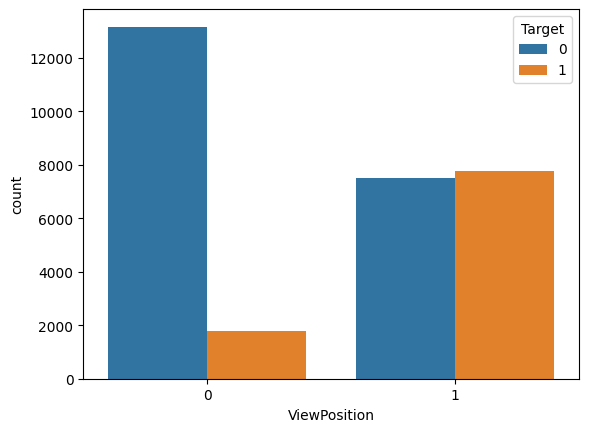

In [ ]:
sns.countplot(x = 'ViewPosition', hue = 'Target', data = df_meta)


In [ ]:
df_meta.corr()

,x,y,width,height,Target,PatientAge,PatientSex,ViewPosition
x,1.000000,0.007369,-0.058112,0.008622,NaN,-0.016029,-0.017303,0.022340
y,0.007369,1.000000,-0.298747,-0.644716,NaN,0.104031,0.052771,-0.124396
width,-0.058112,-0.298747,1.000000,0.596605,NaN,0.027618,0.123828,0.087007
height,0.008622,-0.644716,0.596605,1.000000,NaN,-0.005576,0.053366,0.275493
Target,NaN,NaN,NaN,NaN,1.000000,-0.056822,0.016831,0.420057
PatientAge,-0.016029,0.104031,0.027618,-0.005576,-0.056822,1.000000,-0.009742,-0.060294
PatientSex,-0.017303,0.052771,0.123828,0.053366,0.016831,-0.009742,1.000000,0.016830
ViewPosition,0.022340,-0.124396,0.087007,0.275493,0.420057,-0.060294,0.016830,1.000000


From the above correlation matrix, there is a high correlation between ViewPosition and Target features.

# Model training with random forest classifier

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
figure(figsize=(15, 12), dpi=120)
import seaborn as sns
sns.set(style='whitegrid') #set seaborn plotting aesthetics
%matplotlib inline

import pydicom as dcm
from pathlib import Path
import os
from tqdm.notebook import tqdm

<Figure size 1800x1440 with 0 Axes>

In [ ]:
##Random Forest
train_class = pd.read_csv('/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_detailed_class_info.csv')
train_labels = pd.read_csv('/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_train_labels.csv')

train_path = Path('/content/stage_2_train_images')
test_path = Path('/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_test_images')

train_meta = pd.concat([train_labels,
                        train_class.drop(columns=['patientId'])], axis=1)
train_meta=train_meta.drop(['class'], axis=1)

box_df = train_meta.groupby('patientId').size().reset_index(name='boxes')

train_ds = pd.merge(train_meta, box_df, on='patientId')

box_df = box_df.groupby('boxes').size().reset_index(name='patients')


# List of information we needs with us
vars = ['PatientAge','PatientSex','ImagePath']


def process_dicom_data(df, path):

    # adding new columns to the imported DataFrame with Null values
    for var in vars:
        df[var] = None

    images = os.listdir(path)

    #looping through each dicom image, extract the information from it, and
    # add it to the DataFrame

    for i, img_name in tqdm(enumerate(images)):

        imagePath = os.path.join(path,img_name)
        img_data = dcm.read_file(imagePath)

        idx = (df['patientId']==img_data.PatientID)
        df.loc[idx,'PatientAge'] = pd.to_numeric(img_data.PatientAge)
        df.loc[idx,'PatientSex'] = img_data.PatientSex
        df.loc[idx, 'ImagePath'] = str.format(imagePath)

process_dicom_data(train_ds,'/content/stage_2_train_images')

0it [00:00, ?it/s]

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Activation, Dropout
import glob, pylab
import pandas as pd
import pydicom
import numpy as np
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import gc
import os
import cv2
import warnings
warnings.simplefilter(action = 'ignore')

from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import tensorflow as tf
from tensorflow import keras
%matplotlib inline
import csv
import random

In [ ]:
images = []
ADJUSTED_IMAGE_SIZE = 128
imageList = []
classLabels = []
labels = []
originalImage = []

def readAndReshapeImage(image):
    img = np.array(image).astype(np.uint8)
    res = cv2.resize(img,(ADJUSTED_IMAGE_SIZE,ADJUSTED_IMAGE_SIZE), interpolation = cv2.INTER_LINEAR)
    return res

def populateImage(rowData):
    for index, row in rowData.iterrows():
        patientId = row.patientId
        classlabel = row["Target"]
        dcm_file = '/content/stage_2_train_images/'+'{}.dcm'.format(patientId)
        dcm_data = dcm.read_file(dcm_file)
        img = dcm_data.pixel_array

        ## Converting the image to 3 channels as the dicom image pixel does not have colour classes wiht it
        if len(img.shape) != 3 or img.shape[2] != 3:
            img = np.stack((img,) * 3, -1)

        imageList.append(readAndReshapeImage(img))
#         originalImage.append(img)
        classLabels.append(classlabel)
    tmpImages = np.array(imageList)
    tmpLabels = np.array(classLabels)
#     originalImages = np.array(originalImage)
    return tmpImages,tmpLabels

images, labels = populateImage(train_meta)
print(images.shape , labels.shape)

(30227, 128, 128, 3) (30227,)


In [ ]:
from sklearn.preprocessing import LabelBinarizer
encode = LabelBinarizer()
y = encode.fit_transform(labels)

## splitting into train ,test and validation data

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, y, test_size=0.3, random_state=50)
X_test, X_val, y_test, y_val = train_test_split(X_test,y_test, test_size = 0.5, random_state=50)

In [ ]:
X_train = np.array(X_train)
X_train = X_train.reshape(X_train.shape[0],X_train.shape[1]*X_train.shape[2]*X_train.shape[3])
y_train = np.array(y_train)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
X_test = np.array(X_test)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1]*X_test.shape[2]*X_test.shape[3])

In [ ]:
ypred = model.predict(X_test)

In [ ]:
from sklearn import metrics

print(metrics.classification_report(ypred, y_test))

              precision    recall  f1-score   support

           0       0.92      0.86      0.89      3303
           1       0.68      0.80      0.74      1231

    accuracy                           0.84      4534
   macro avg       0.80      0.83      0.81      4534
weighted avg       0.86      0.84      0.85      4534



In [ ]:
print(confusion_matrix(y_test,ypred))

[[2840  242]
 [ 463  989]]


Text(109.44999999999997, 0.5, 'true label')

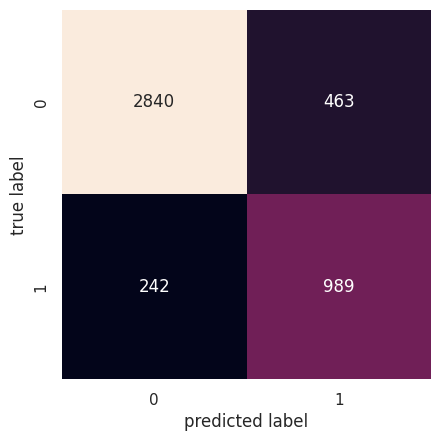

In [ ]:
from sklearn.metrics import confusion_matrix
mat=confusion_matrix(y_test, ypred)
sns.heatmap(mat.T,square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('predicted label')
plt.ylabel('true label')

In [ ]:
y_test

array([[0, 0, 1],
       [1, 0, 0],
       [1, 0, 0],
       ...,
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1]])

The random forest classifier gave an acurracy of 84% and a F1 score of 89% percent. it was pretty good results. we can further explore with CNN model

In [ ]:
#Random Forest END

## LGBM Classifier

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold

import warnings
warnings.simplefilter("ignore")

In [ ]:
def fast_lgbm_cv_scores(df, target, task, rs = 0):

    clf = LGBMClassifier(n_estimators = 10000, nthread = 4, random_state = rs)
    metric = 'auc'

    folds = KFold(n_splits = 2, shuffle = True, random_state = rs)

    pred = np.zeros(df.shape[0])

    feats = df.columns.drop(target)

    feature_importance_df = pd.DataFrame(index = feats)

    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df[feats], df[target])):
        train_x, train_y = df[feats].iloc[train_idx], df[target].iloc[train_idx]
        valid_x, valid_y = df[feats].iloc[valid_idx], df[target].iloc[valid_idx]

        clf.fit(train_x, train_y,
                eval_set = [(valid_x, valid_y)], eval_metric = metric,
                verbose = -1, early_stopping_rounds = 100)

        pred[valid_idx] = clf.predict_proba(valid_x, num_iteration = clf.best_iteration_)[:, 1]

        feature_importance_df[n_fold] = pd.Series(clf.feature_importances_, index = feats)

        del train_x, train_y, valid_x, valid_y
        gc.collect()

    return feature_importance_df, pred, roc_auc_score(df[target], pred)

In [ ]:
f_imp, _, score = fast_lgbm_cv_scores(df_meta.drop(['patientId', 'x', 'y', 'width', 'height'], axis = 1),
                                      target = 'Target', task = 'classification')
print('ROC-AUC for Target = {}'.format(score))


[LightGBM] [Warning] num_threads is set with nthread=4, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] num_threads is set with nthread=4, will be overridden by n_jobs=-1. Current value: num_threads=-1
ROC-AUC for Target = 0.7525063266902242


As we can see from the area under the ROC curve is quite high (~0.75) which means that there is significant information we can get from the metadata regarding the target column. This shows that the first approach that we proposed has some significant potential.

In [ ]:
f_imp

,0,1
PatientAge,382,1001
PatientSex,53,130
ViewPosition,15,39


## BASIC CNN FROM SCRACTH

In [ ]:
import os
import csv
import random
import pydicom
import numpy as np
import pandas as pd
from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
%matplotlib inline

In [ ]:
pneumonia_locations = {}
# load table
with open(os.path.join('/content/drive/MyDrive/Capstone-project/stage_2_train_labels.csv'),
          'r') as infile:
    reader = csv.reader(infile)
    next(reader, None)
    for rows in reader:
        filename = rows[0]
        location = rows[1:5]
        pneumonia = rows[5]
        if pneumonia == '1':
            location = [int(float(i)) for i in location]
            if filename in pneumonia_locations:
                pneumonia_locations[filename].append(location)
            else:
                pneumonia_locations[filename] = [location]

In [ ]:
folder = '/content/stage_2_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
n_valid_samples = 4000
train_filenames = filenames[n_valid_samples:]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples

n train samples 22684
n valid samples 4000


In [ ]:
class generator(keras.utils.Sequence):
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=256, shuffle=True, augment=False, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()

    def __load__(self, filename):
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        msk = np.zeros(img.shape)
        filename = filename.split('.')[0]
        if filename in self.pneumonia_locations:
            for location in self.pneumonia_locations[filename]:
                x, y, w, h = location
                msk[y:y+h, x:x+w] = 1
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode='reflect') > 0.5
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk

    def __loadpredict__(self, filename):
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        img = np.expand_dims(img, -1)
        return img

    def __getitem__(self, index):
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        if self.predict:
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            imgs = np.array(imgs)
            return imgs, filenames
        else:
            items = [self.__load__(filename) for filename in filenames]
            imgs, msks = zip(*items)
            imgs = np.array(imgs)
            msks = np.array(msks)
            return imgs, msks

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)

    def __len__(self):
        if self.predict:
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            return int(len(self.filenames) / self.batch_size)

In [ ]:
def iou_loss(y_true, y_pred):
    y_true=tf.cast(y_true, tf.float32)
    y_pred=tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
BATCH_SIZE = 128
IMAGE_SIZE = 128

In [ ]:
model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam', loss=iou_bce_loss, metrics=['accuracy', mean_iou])

# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.0001
    epochs = 3
    return lr*(np.cos(np.pi*x/epochs)+1.)/2


learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)

# create train and validation generators
folder = '/content/stage_2_train_images'
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE,
                      image_size=IMAGE_SIZE, shuffle=True, augment=False, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE,
                      image_size=IMAGE_SIZE, shuffle=False, predict=False)

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  288         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
EPOCHS=5
MULTI_PROCESSING = True

history = model.fit_generator(train_gen, validation_data=valid_gen, callbacks=[learning_rate], epochs=EPOCHS,
                              workers=4, use_multiprocessing=MULTI_PROCESSING)

Epoch 1/5
177/177 [==============================] - 2666s 14s/step - loss: 0.4911 - accuracy: 0.9596 - mean_iou: 0.6586 - val_loss: 0.4463 - val_accuracy: 0.9614 - val_mean_iou: 0.6894 - lr: 1.0000e-04
Epoch 2/5
177/177 [==============================] - 2672s 15s/step - loss: 0.4376 - accuracy: 0.9676 - mean_iou: 0.7201 - val_loss: 0.4520 - val_accuracy: 0.9567 - val_mean_iou: 0.6738 - lr: 7.5000e-05
Epoch 3/5
177/177 [==============================] - 2654s 15s/step - loss: 0.4191 - accuracy: 0.9699 - mean_iou: 0.7340 - val_loss: 0.4155 - val_accuracy: 0.9697 - val_mean_iou: 0.7403 - lr: 2.5000e-05
Epoch 4/5
177/177 [==============================] - 2664s 15s/step - loss: 0.4117 - accuracy: 0.9684 - mean_iou: 0.7302 - val_loss: 0.4168 - val_accuracy: 0.9674 - val_mean_iou: 0.7296 - lr: 0.0000e+00
Epoch 5/5
177/177 [==============================] - 2737s 15s/step - loss: 0.4100 - accuracy: 0.9712 - mean_iou: 0.7429 - val_loss: 0.4152 - val_accuracy: 0.9690 - val_mean_iou: 0.7419 - 

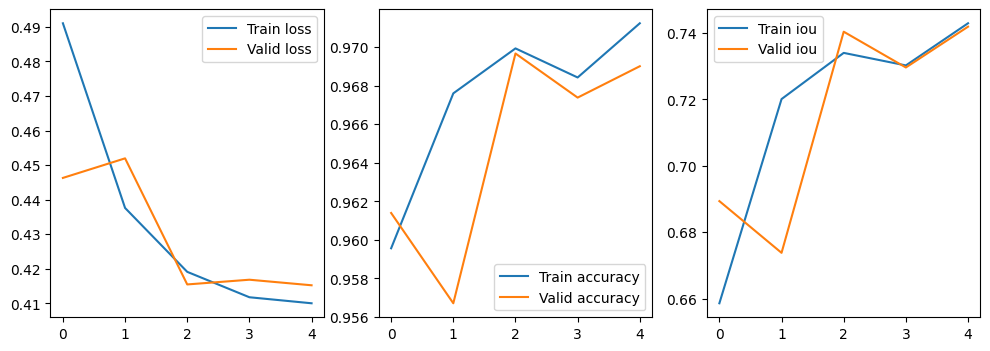

In [ ]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()

4/4 [==============================] - 1s 22ms/step


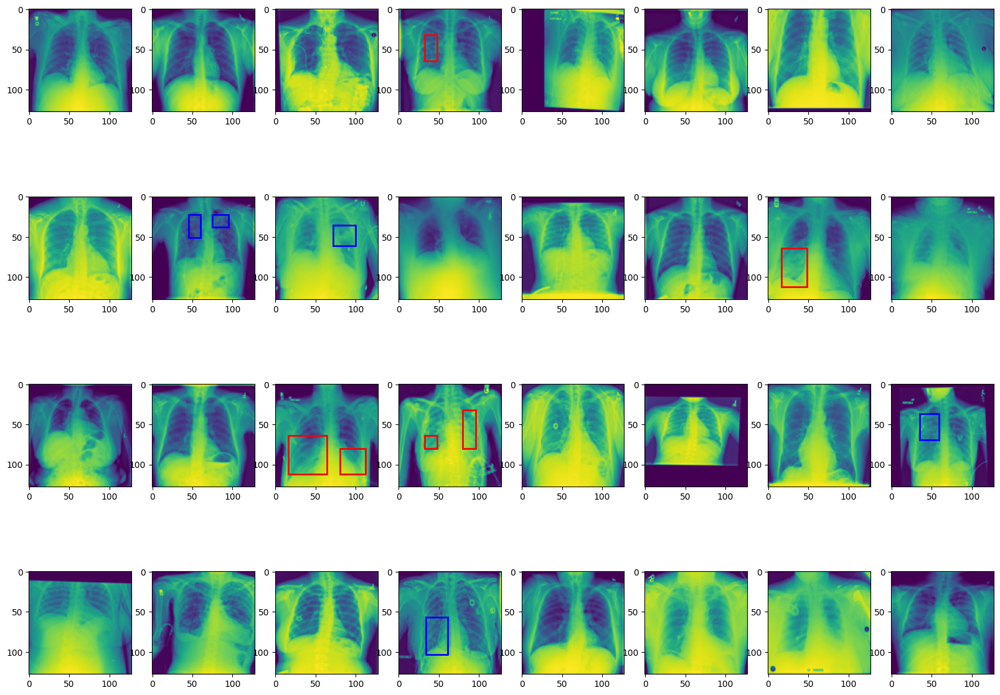

In [ ]:
i=0
for imgs, msks in valid_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(4, 8, figsize=(20,15))
    axarr = axarr.ravel()
    axidx = 0
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        i=i+1
        #exit after 32 images
        if i>32:
            break
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='b',facecolor='none'))
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

the basic CNN gave good results. we can try with further exploring with transfer learning, or by using Faster RCNN. we can also try by tuning the Hyperparameters of CNN model

**We have tried three models:**<br>
1) Randomforest <br>
2) LGBM Classifier<br>
3) CNN<br>

> Model Score for LGBM Classifier:ROC-AUC for Target = 75% <br>

> Model score for Random Forest: F1score: 62%

> The trained CNN model achieved a training accuracy of 0.97 and validation
accuracy of 0.96, which is promising for the detection of pneumonia from chest
radiographs. The training and validation loss is around 0.41, which can be further
improved in the next steps



End of Milestone-1. further transfer learning models with hyperperameter tuinig have to be done to find out the best model.

## TRANSFER LEARNING USING VGG19

In [ ]:
#Start VGG19

In [ ]:
import os
import csv
import random
import pydicom
import numpy as np
import pandas as pd
from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tqdm import tqdm

%matplotlib inline

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_train_labels.csv')


In [ ]:
df['path']='/content/stage_2_train_images/'+df['patientId'].astype(str)+'.dcm'
negative=df[df['Target']==0]
print(len(negative))

20672


In [ ]:
positive=df[df['Target']==1]
unique_positive=positive[['path','patientId']]
path=unique_positive['path'].unique()
patientId=unique_positive['patientId'].unique()

unique_positive=pd.DataFrame({'path':path,'patientId':patientId})
len(unique_positive)


6012

In [ ]:
for _,row in tqdm(unique_positive.iterrows()):
    img=pydicom.read_file(row['path']).pixel_array
    img=resize(img,(256,256))
    plt.imsave('/content/working/data/positive/'+row['patientId']+'.jpg',img,cmap='gray')

6012it [04:56, 20.27it/s]


In [ ]:
for _,row in tqdm(negative.iterrows()):
    img=pydicom.read_file(row['path']).pixel_array
    img=resize(img,(256,256))
    plt.imsave('/content/working/data/negative/'+row['patientId']+'.jpg',img,cmap='gray')

20672it [16:27, 20.94it/s]


In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19,preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
datagen=ImageDataGenerator(samplewise_center=True,samplewise_std_normalization=True,horizontal_flip=True,
                          width_shift_range=0.05,rescale=1/255,fill_mode='nearest',height_shift_range=0.05,
                           preprocessing_function=preprocess_input,validation_split=0.3,
                          )


In [ ]:
# Create data-generators for training and validation/testing
train=datagen.flow_from_directory('/content/working/data',color_mode='rgb',batch_size=32,target_size=(256, 256),
                                  class_mode='binary',subset='training')
test=datagen.flow_from_directory('/content/working/data',color_mode='rgb',batch_size=32,target_size=(256, 256),
                                 class_mode='binary',subset='validation')

Found 18680 images belonging to 3 classes.
Found 8004 images belonging to 3 classes.


In [ ]:
pre_trained_model = VGG19(input_shape = (256,256,3),
                                include_top = False,
                                weights = 'imagenet')

for layer in pre_trained_model.layers:
    layer.trainable = False

# pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('block5_pool')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

80134624/80134624 [==============================] - 0s 0us/step
last layer output shape:  (None, 8, 8, 512)


In [ ]:
from tensorflow.keras.layers import Flatten,Dense,Dropout,BatchNormalization,LeakyReLU,ReLU,GaussianDropout

In [ ]:
model = Flatten()(last_output)
model = Dense(1024)(model)
model=ReLU(0.1)(model)
model=Dropout(0.25)(model)
model=BatchNormalization()(model)
model = Dense(1024)(model)
model=ReLU(0.1)(model)
model=Dropout(0.25)(model)
model=BatchNormalization()(model)
model = Dense(1, activation='sigmoid')(model)

In [ ]:
from tensorflow.keras.models import Model


In [ ]:
fmodel = Model( pre_trained_model.input, model)

fmodel.compile(optimizer = 'adam',
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

fmodel.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau


In [ ]:
early=EarlyStopping(monitor='accuracy',patience=3,mode='auto')
reduce_lr = ReduceLROnPlateau(monitor='accuracy', factor=0.5,
                              patience=2, verbose=1,cooldown=0, mode='auto',min_delta=0.0001, min_lr=1e-5)

In [ ]:
history=fmodel.fit(train,epochs=4,callbacks=[reduce_lr],
           steps_per_epoch=100,validation_data=test)

Epoch 1/4
100/100 [==============================] - 202s 2s/step - loss: -0.1549 - accuracy: 0.6528 - val_loss: -1.1546 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 2/4
100/100 [==============================] - 196s 2s/step - loss: -2.1692 - accuracy: 0.7700 - val_loss: -4.0781 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 3/4
100/100 [==============================] - 186s 2s/step - loss: -7.4083 - accuracy: 0.7694 - val_loss: -12.9802 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 4/4
100/100 [==============================] - 196s 2s/step - loss: -19.1450 - accuracy: 0.7769 - val_loss: -28.8658 - val_accuracy: 0.7747 - lr: 0.0010


<Axes: >

<Figure size 3000x2000 with 0 Axes>

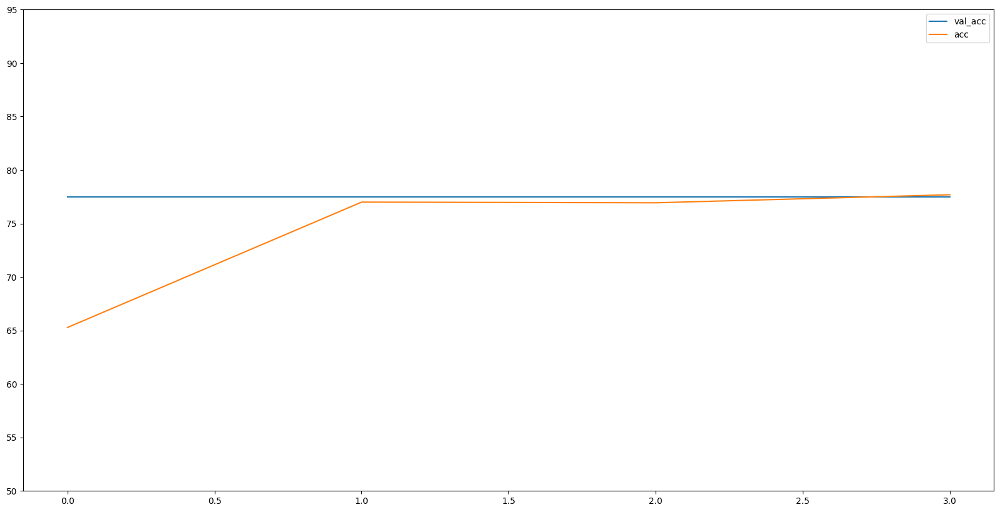

In [ ]:
# Plot accuracy
plt.figure(figsize=(30,20))
val_acc=np.asarray(fmodel.history.history['val_accuracy'])*100
acc=np.asarray(fmodel.history.history['accuracy'])*100
acc=pd.DataFrame({'val_acc':val_acc,'acc':acc})
acc.plot(figsize=(20,10),yticks=range(50,100,5))

<Axes: >

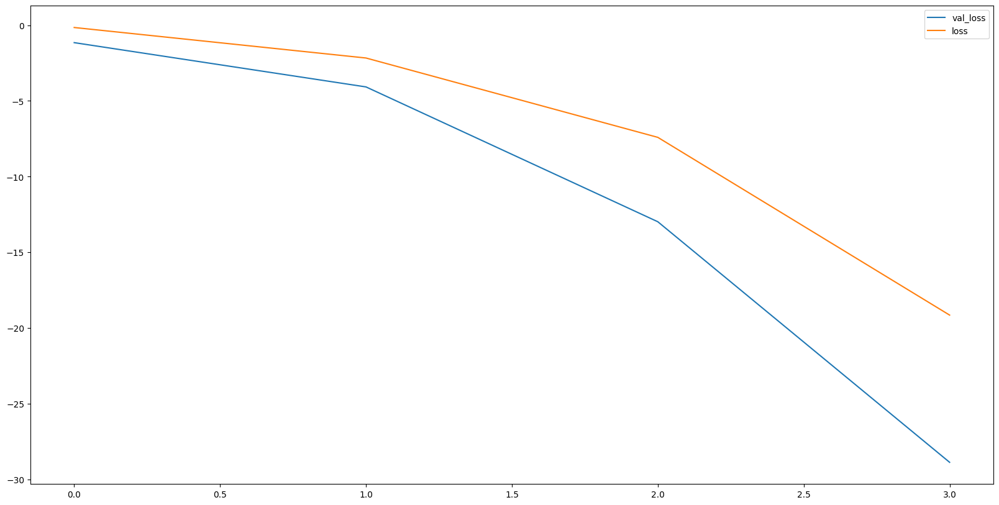

In [ ]:
# Plot loss
loss=fmodel.history.history['loss']
val_loss=fmodel.history.history['val_loss']
loss=pd.DataFrame({'val_loss':val_loss,'loss':loss})
loss.plot(figsize=(20,10))


In [ ]:
y=[]

test.reset()

for i in tqdm(range(84)):
    _,tar=test.__getitem__(i)
    for j in tar:
        y.append(j)

100%|██████████| 84/84 [00:54<00:00,  1.53it/s]


In [ ]:
test.reset()
y_pred=fmodel.predict(test)

251/251 [==============================] - 152s 605ms/step


In [ ]:
pred=[]
for i in y_pred:
    if i[0]>=0.5:
        pred.append(1)
    else:
        pred.append(0)

In [ ]:
from sklearn.metrics import roc_curve,auc,precision_recall_curve,classification_report


In [ ]:
# Classification report
print(classification_report(y,pred[:len(y)]))

              precision    recall  f1-score   support

         1.0       0.76      1.00      0.87      2050
         2.0       0.00      0.00      0.00       638

    accuracy                           0.76      2688
   macro avg       0.38      0.50      0.43      2688
weighted avg       0.58      0.76      0.66      2688



Text(113.9222222222222, 0.5, 'true label')

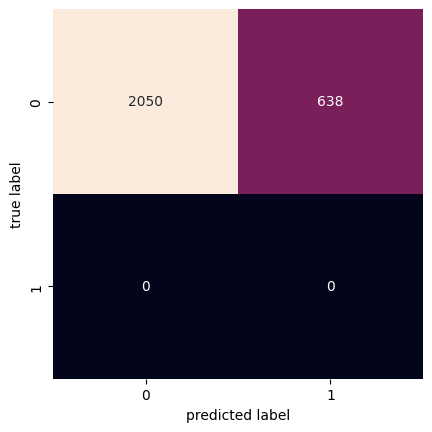

In [ ]:
from sklearn.metrics import confusion_matrix
mat=confusion_matrix(y, pred[:len(y)])
sns.heatmap(mat.T,square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('predicted label')
plt.ylabel('true label')

After trying a CNN model with transfer learning of VGG 19,it gave an accuracy of 76% and F1 score of 87%.we can further explore with RCNN

END VGG19

# MODEL TRAINING WITH RCNN


Start RCNN

In [ ]:
import PIL
import torch
import torchvision
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["axes.grid"] = False

In [ ]:
seed = 42
num_classes = 2
batch_size = 10
train_img_size = 256
origin_img_size = 1024
scale_factor = train_img_size / origin_img_size
np.random.seed(seed)

In [ ]:
train_df = "/content/stage_2_train_images"
test_df = "/content/stage_2_test_images"
detailed_df = "/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_detailed_class_info.csv"
labels_csv = "/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_train_labels.csv"
submission_csv= "/content/drive/MyDrive/PGP_AIML_GL/Projects/CapstoneProj/stage_2_sample_submission.csv"
rcnn_losses = ["loss_objectness", "loss_box_reg", "loss_rpn_box_reg"]

In [ ]:
train_imgs = os.listdir(os.path.join(detailed_df, train_df))
test_imgs =  [patienId + ".dcm" for patienId in pd.read_csv(os.path.join(detailed_df, submission_csv)).patientId]

In [ ]:
from sklearn.model_selection import train_test_split

train_imgs, valid_imgs = train_test_split(train_imgs, test_size=0.33, random_state=seed)

print(f"Number of training samples: {len(train_imgs)}")
print(f"Number of validation samples: {len(valid_imgs)}")

Number of training samples: 17878
Number of validation samples: 8806


In [ ]:
train_label_df = pd.read_csv(os.path.join(detailed_df, labels_csv))
train_label_df.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [ ]:
isna_count = len(train_label_df[train_label_df.Target == 0]) # number of images without bounding box
train_label_df = train_label_df[train_label_df.Target == 1]
train_label_df.rename(columns={"x": "X0", "y": "Y0"}, inplace=True)
train_label_df["X1"] = train_label_df["X0"] + train_label_df["width"]
train_label_df["Y1"] = train_label_df["Y0"] + train_label_df["height"]
train_label_df[["X0", "X1", "Y0", "Y1"]] = train_label_df[["X0", "X1", "Y0", "Y1"]] * scale_factor
train_label_df["area"] = train_label_df["width"] * scale_factor * train_label_df["height"] * scale_factor
train_label_df.drop(["width", "height"], axis=1, inplace=True)
train_label_df.head()

,patientId,X0,Y0,Target,X1,Y1,area
4,00436515-870c-4b36-a041-de91049b9ab4,66.00,38.00,1,119.25,132.75,5045.4375
5,00436515-870c-4b36-a041-de91049b9ab4,140.50,38.00,1,204.50,151.25,7248.0000
8,00704310-78a8-4b38-8475-49f4573b2dbb,80.75,144.25,1,120.75,170.25,1040.0000
9,00704310-78a8-4b38-8475-49f4573b2dbb,173.75,143.75,1,214.25,178.00,1387.1250
14,00aecb01-a116-45a2-956c-08d2fa55433f,72.00,80.50,1,95.50,114.25,793.1250


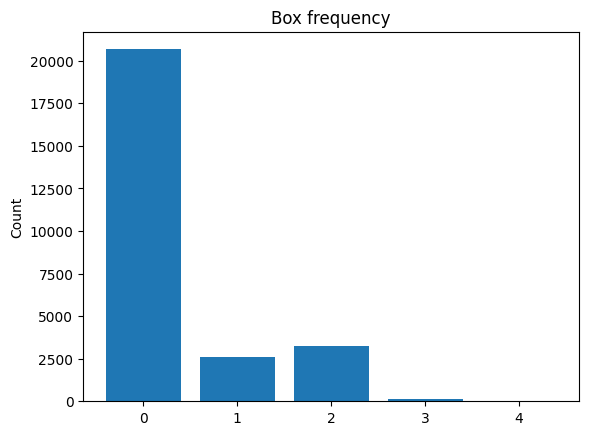

In [ ]:
from collections import Counter

cnt = Counter(train_label_df.patientId)
sample_batch = [sample[0] + ".dcm" for sample in cnt.most_common(2)] # We will take two imgs with 4 boxes to display
counts = pd.Series(cnt.values()).value_counts()
counts[0] = isna_count
plt.title("Box frequency")
plt.ylabel("Count")
plt.xticks(counts.index)
plt.bar(counts.index, counts)
plt.show()
del cnt

In [ ]:
counts.sort_values(ascending=False)


0    20672
2     3266
1     2614
3      119
4       13
dtype: int64

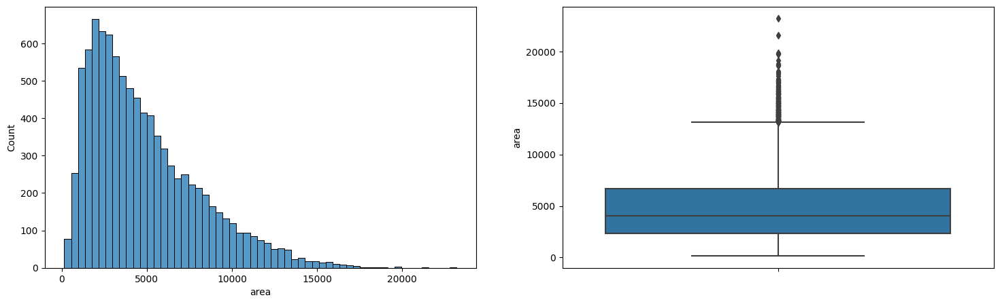

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18, 5))
sns.histplot(data=train_label_df, x="area", ax=axs[0])
sns.boxplot(y=train_label_df["area"])
plt.show()

In [ ]:
from torchvision.utils import draw_bounding_boxes, make_grid


def find_boxes(img_name, label_df):
    patient_id = img_name.split(".")[0]
    boxes = label_df[label_df.patientId == patient_id]
    boxes_coord = boxes[["X0", "Y0", "X1", "Y1"]].to_numpy()

    return boxes_coord, boxes.area.to_numpy()


def read_images(img_names, label_df, resize):
    batch = []
    for img_name in img_names:
        img_path = os.path.join(detailed_df, train_df, img_name)
        img = PIL.Image.fromarray(pydicom.dcmread(img_path).pixel_array).convert("RGB")
        img = img.resize(resize)
        img = np.array(img)

        boxes, _ = find_boxes(img_name, label_df)

        img = torch.tensor(img, dtype=torch.uint8)
        boxes = torch.tensor(boxes, dtype=torch.int32)
        batch.append((img, boxes))
    return batch


def plot_samples(batch, n_rows=3, n_cols=5, box_color="red", titles=None, box_width=3, fig_size=(20,12)):
    assert len(batch) >= n_rows * n_cols, f"Not enough samples to display, required at least {n_rows * n_cols} samples"
    fig, axs = plt.subplots(n_rows, 1, figsize=fig_size)
    fig.tight_layout()
    imgs_with_boxes = []
    for sample in batch[:n_rows * n_cols]:
        scores = None
        if len(sample) == 2:
            image, boxes = sample
        else:
            image, boxes, scores = sample
            scores = [f"Score: {score:.2f}" for score in scores]

        img = draw_bounding_boxes(image=image.permute(2, 0, 1),
                                  boxes=boxes,
                                  colors=box_color,
                                  labels=scores,
                                  width=box_width)
        imgs_with_boxes.append(img)

    for i, ax in enumerate(axs):
        if titles:
            ax.set_title(titles[i], fontsize=18)
        img_with_boxes = make_grid(imgs_with_boxes[i * n_cols: (i + 1) * n_cols]).numpy()
        ax.imshow(np.transpose(img_with_boxes, (1, 2, 0)))
    plt.show()


sample_batch = np.concatenate([sample_batch, np.random.choice(train_imgs, size=13)])
sample_batch = read_images(sample_batch, train_label_df, (train_img_size, train_img_size))
plot_samples(sample_batch)

In [ ]:
import imgaug
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

class Augmentation:
    def __init__(self,
                 x_translation=(-0.05, 0.05),
                 rotate=(-5, 5),
                 scale=(0.9, 1.1),
                 noice=(0, 10),
                 blur=(0, 0.1)):

        self.transform = iaa.Sequential([
            iaa.Affine(translate_percent={"x": x_translation}, scale=scale, rotate=rotate),
            iaa.AdditiveGaussianNoise(scale=noice),
            iaa.GaussianBlur(sigma=blur)])

    def __call__(self, image, boxes):
        bbs = BoundingBoxesOnImage([BoundingBox(x1=box[0], y1=box[1], x2=box[2], y2=box[3])
                                    for box in boxes], shape=image.shape)

        image, bbs = self.transform(image=image, bounding_boxes=bbs)
        return image, bbs.to_xyxy_array()

    def worker_init_fn(self, worker_id):
        """Set unique seed for each worker."""
        imgaug.seed(np.random.get_state()[1][0] + worker_id)
from torchvision.transforms import PILToTensor, ConvertImageDtype

class PneumoniaDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms, img_names, train_img_size, labels=None):
        self.root = root
        self.transforms = transforms
        self.img_names = img_names
        self.resize = (train_img_size, train_img_size)
        self.labels = labels

    def __getitem__(self, idx):
        """Load image, boxes and process them"""
        img_name = self.img_names[idx]

        img_path = os.path.join(self.root, self.img_names[idx])
        img = PIL.Image.fromarray(pydicom.dcmread(img_path).pixel_array).convert("RGB")
        img = img.resize(self.resize)
        img = np.array(img)

        if self.labels is None:
            return torch.tensor(img / 255.).permute(2, 0, 1).float()

        boxes, area = find_boxes(img_name, self.labels)
        n_objects = len(boxes)
        if self.transforms is not None:
            img, boxes = self.transforms(img, boxes)

        img = torch.tensor(img / 255.).permute(2, 0, 1).float()

        target = {}
        target["image_id"] = torch.tensor([idx])
        target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
        target["labels"] = torch.ones(n_objects, dtype=torch.int64)
        target["area"] = torch.as_tensor(area, dtype=torch.float32)
        target["iscrowd"] = torch.zeros(n_objects, dtype=torch.int32)
        return img, target

    def __len__(self):
        return len(self.img_names)

    def collate_fn(self, batch):
        return tuple(zip(*batch))

In [ ]:
from torch.utils.data import DataLoader

augmentation = Augmentation()
train_ds = PneumoniaDataset(os.path.join(detailed_df, train_df), augmentation, train_imgs, train_img_size, train_label_df)
valid_ds = PneumoniaDataset(os.path.join(detailed_df, train_df), None, valid_imgs, train_img_size, train_label_df)
test_ds = PneumoniaDataset(os.path.join(detailed_df, test_df), None, test_imgs, train_img_size)

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=train_ds.collate_fn,
                          worker_init_fn=augmentation.worker_init_fn)
valid_loader = DataLoader(valid_ds, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=valid_ds.collate_fn)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=2)

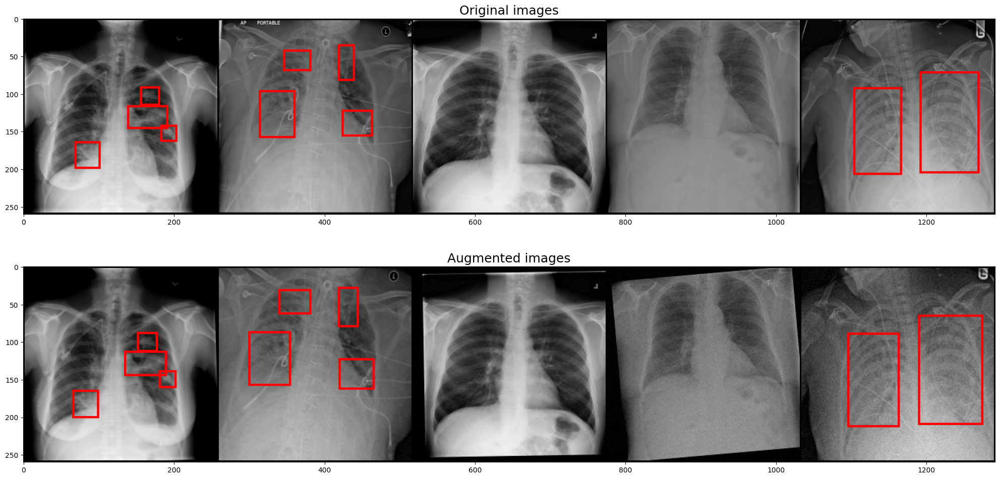

In [ ]:
def process_batch(idx, sample):
    img, boxes = sample

    augmentation = Augmentation()
    augmentation.worker_init_fn(idx)
    img, boxes = augmentation(img.numpy(), boxes.numpy())
    img = torch.tensor(img, dtype=torch.uint8)
    boxes = torch.tensor(boxes, dtype=torch.float32)
    return img, boxes


augmented_batch = sample_batch[:5] + [process_batch(i, sample) for i, sample in enumerate(sample_batch[:5])]
plot_samples(augmented_batch, titles=["Original images", "Augmented images"], fig_size=(20, 10), n_rows=2)
del sample_batch, augmented_batch

In [ ]:
!pip install git+https://github.com/PyTorchLightning/pytorch-lightning
import pytorch_lightning as pl
print(pl.__version__)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/PyTorchLightning/pytorch-lightning to /tmp/pip-req-build-vrp956sq
  Running command git clone --filter=blob:none --quiet https://github.com/PyTorchLightning/pytorch-lightning /tmp/pip-req-build-vrp956sq
  Resolved https://github.com/PyTorchLightning/pytorch-lightning to commit 7268670d1aec7d40241962c5bc81b0b871de0a57
  Running command git submodule update --init --recursive -q
  Encountered 31 file(s) that should have been pointers, but weren't:
        .notebooks/course_UvA-DL/01-introduction-to-pytorch.ipynb
        .notebooks/course_UvA-DL/02-activation-functions.ipynb
        .notebooks/course_UvA-DL/03-initialization-and-optimization.ipynb
        .notebooks/course_UvA-DL/04-inception-resnet-densenet.ipynb
        .notebooks/course_UvA-DL/05-transformers-and-MH-attention.ipynb
        .notebooks/course_UvA-DL/06-graph-neural-networks.ipynb
        .notebo

In [ ]:
import pytorch_lightning as pl
from torchvision.ops import nms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


class LitRCNN(pl.LightningModule):
    def __init__(self, num_classes):
        super().__init__()

        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

        self.model = model

    def forward(self, x):
        self.model.eval()

        outputs =  self.model(x)

        preds = []
        for output in outputs:
            boxes = output["boxes"]
            scores = output["scores"]
            idx = nms(boxes,scores, 0.05)
            preds.append({"boxes": boxes[idx].cpu().detach().numpy(), "scores": scores[idx].cpu().detach().numpy()})

        return preds

    def training_step(self, batch, batch_idx):
        images, targets = batch

        losses = self.model(images, targets)

        loss = sum(loss for loss in losses.values())
        self.log_losses(loss, losses)

        return loss

    def validation_step(self, batch, batch_idx):
        self.model.train()

        images, targets = batch
        losses = self.model(images, targets)

        loss = sum(loss for loss in losses.values())
        self.log_losses(loss, losses, mode="val")

    def predict_step(self, batch, batch_idx):
        return self.forward(batch)

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(),  lr=0.005, momentum=0.9, weight_decay=0.0005)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.3)

        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "epoch",
                "frequency": 1}}

    def log_losses(self, loss, losses, mode="train"):
        self.log_dict({f"{mode}_loss": loss,
                       f"{mode}_loss_box_reg": losses['loss_box_reg'],
                       f"{mode}_loss_objectness": losses['loss_objectness'],
                       f"{mode}_loss_rpn_box_reg": losses['loss_rpn_box_reg']}, on_step=False, on_epoch=True, batch_size=batch_size)

model = LitRCNN(num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 72.0MB/s]


In [ ]:
from pytorch_lightning import Callback
from pytorch_lightning.callbacks import ModelCheckpoint


class MetricsCallback(Callback):
    """PyTorch Lightning metric callback."""

    def __init__(self, metrics):
        super().__init__()
        self.metrics = metrics
        self.training = {}
        self.validations = {}

    def on_train_epoch_end(self, trainer, pl_module):
        self.training[trainer.current_epoch] = {metric: trainer.callback_metrics["train_" + metric] for metric in self.metrics}

    def on_validation_end(self, trainer, pl_module):
        self.validations[trainer.current_epoch] = {metric: trainer.callback_metrics["val_" + metric] for metric in self.metrics}


checkpoint_callback = ModelCheckpoint(dirpath='checkpoints',
                                      filename='{epoch}-{val_loss:.4f}',
                                      every_n_epochs=1,
                                      monitor='val_loss',
                                      save_top_k=1,
                                      mode='min')

callbacks = [MetricsCallback(["loss"] + rcnn_losses), checkpoint_callback]

In [ ]:
%%capture
! pip install git+https://github.com/PytorchLightning/pytorch-lightning.git@master --upgrade

In [ ]:
import os

import torch
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST
from torchvision import transforms

import pytorch_lightning as pl

class CoolSystem(pl.LightningModule):

    def __init__(self, classes=10):
        super().__init__()
        self.save_hyperparameters()

        # not the best model...
        self.l1 = torch.nn.Linear(28 * 28, self.hparams.classes)

    def forward(self, x):
        return torch.relu(self.l1(x.view(x.size(0), -1)))

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = F.cross_entropy(y_hat, y)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = F.cross_entropy(y_hat, y)
        return {'val_loss': loss}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        return {'val_loss': avg_loss}

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.001)

In [ ]:
device = "gpu" if torch.cuda.is_available() else "cpu"
print(device)
trainer = pl.Trainer(accelerator=device, max_epochs=3, callbacks=callbacks)
trainer.fit(model=model, train_dataloaders=train_loader, val_dataloaders=valid_loader)

gpu


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params
-------------------------------------
0 | model | FasterRCNN | 41.3 M
-------------------------------------
41.1 M    Trainable params
222 K     Non-trainable params
41.3 M    Total params
165.197   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [ ]:
model = LitRCNN.load_from_checkpoint(trainer.checkpoint_callback.best_model_path, num_classes=num_classes)
print(trainer.checkpoint_callback.best_model_path)

/content/checkpoints/epoch=2-val_loss=0.0732.ckpt


In [ ]:
sample_batch_idx = np.random.choice(len(valid_imgs), size=5)
sample_batch = read_images(np.array(valid_ds.img_names)[sample_batch_idx], train_label_df, (train_img_size, train_img_size))

In [ ]:
sample_batch_idx

array([5393, 8792, 8433, 7513, 2612])

In [ ]:
dpt=[valid_ds[i][0] for i in sample_batch_idx]

In [ ]:
dpt

[tensor([[[0.8353, 0.7922, 0.6588,  ..., 0.0588, 0.0588, 0.0431],
          [0.7490, 0.5843, 0.3765,  ..., 0.0157, 0.0157, 0.0118],
          [0.5294, 0.3176, 0.1490,  ..., 0.0078, 0.0078, 0.0039],
          ...,
          [0.2667, 0.1176, 0.0431,  ..., 0.0118, 0.0118, 0.0078],
          [0.2706, 0.1294, 0.0510,  ..., 0.0118, 0.0118, 0.0078],
          [0.2745, 0.1451, 0.0706,  ..., 0.0157, 0.0118, 0.0118]],
 
         [[0.8353, 0.7922, 0.6588,  ..., 0.0588, 0.0588, 0.0431],
          [0.7490, 0.5843, 0.3765,  ..., 0.0157, 0.0157, 0.0118],
          [0.5294, 0.3176, 0.1490,  ..., 0.0078, 0.0078, 0.0039],
          ...,
          [0.2667, 0.1176, 0.0431,  ..., 0.0118, 0.0118, 0.0078],
          [0.2706, 0.1294, 0.0510,  ..., 0.0118, 0.0118, 0.0078],
          [0.2745, 0.1451, 0.0706,  ..., 0.0157, 0.0118, 0.0118]],
 
         [[0.8353, 0.7922, 0.6588,  ..., 0.0588, 0.0588, 0.0431],
          [0.7490, 0.5843, 0.3765,  ..., 0.0157, 0.0157, 0.0118],
          [0.5294, 0.3176, 0.1490,  ...,

In [ ]:
dpt[0].type()

'torch.FloatTensor'

In [ ]:
dpt[1].type()

'torch.FloatTensor'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
device

device(type='cuda')

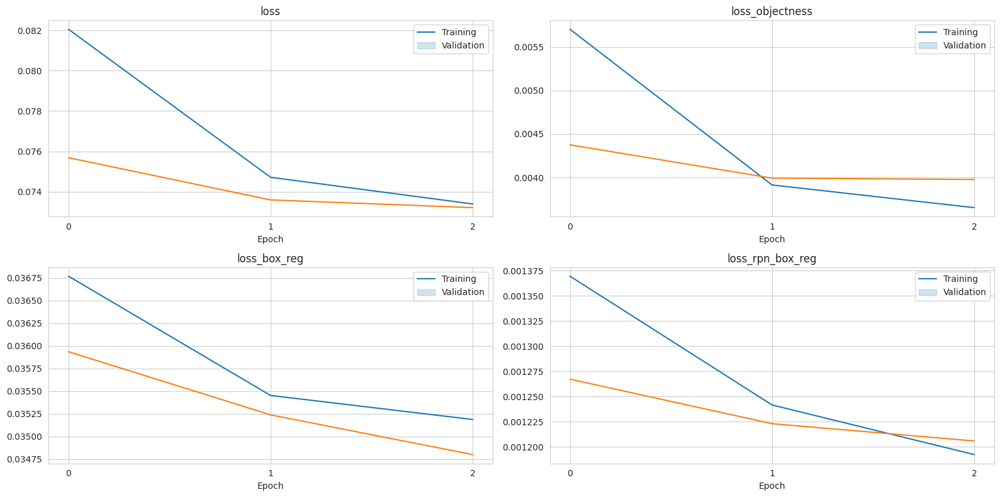

In [ ]:
sns.set_style("whitegrid")
training = pd.DataFrame.from_dict(callbacks[0].training, orient="index").applymap(lambda x: x.cpu().numpy())
validations = pd.DataFrame.from_dict(callbacks[0].validations, orient="index").applymap(lambda x: x.cpu().numpy())
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for ax, metric in zip(axs.flat, callbacks[0].metrics):
    ax.set_title(metric)

    g = sns.lineplot(data=training, x=training.index, y=metric, ax=ax)
    g = sns.lineplot(data=validations, x=validations.index, y=metric, ax=ax)
    g.set(xlabel="Epoch", ylabel=None)
    g.set_xticks(training.index)
    ax.legend(labels=["Training","Validation"])

fig.tight_layout()
plt.show()


In [ ]:
history = trainer.validate(model, dataloaders=valid_loader, verbose=False)
pd.DataFrame(history, index=["Validation"]).T

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

,Validation
val_loss,0.073265
val_loss_box_reg,0.034800
val_loss_objectness,0.003987
val_loss_rpn_box_reg,0.001206


In [ ]:
preds = trainer.predict(model, test_loader)

outputs = []
for batch_pred in preds:
    for sample_pred in batch_pred:
        scores, boxes = sample_pred["scores"], sample_pred["boxes"]
        if len(scores) == 0:
            outputs.append(np.nan)
        else:
            label = ""
            boxes = boxes / scale_factor
            for score, box in zip(scores, boxes):
                label += f"{score:.2f} {box[0]:.1f} {box[1]:.1f} {(box[2]-box[0]):.1f} {(box[3]-box[1]):.1f} "
            outputs.append(label.strip())

submission = pd.read_csv(os.path.join(detailed_df, submission_csv))
submission.PredictionString = outputs
submission.to_csv("submission.csv", header=True, index=False)
submission

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

,patientId,PredictionString
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,NaN
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,NaN
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,NaN
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,NaN
4,00100a24-854d-423d-a092-edcf6179e061,0.46 523.8 389.2 256.6 427.0 0.39 200.0 494.5 ...
...,...,...
2995,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,0.16 355.9 213.7 152.2 299.7 0.07 607.4 579.2 ...
2996,c1ec035b-377b-416c-a281-f868b7c9b6c3,0.17 251.6 570.7 209.8 186.4
2997,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,NaN
2998,c1ef6724-f95f-40f1-b25b-de806d9bc39d,0.60 220.6 391.8 225.3 304.3 0.46 610.3 366.3 ...


In RCNN model training, data was agumented and trained. After training with RCNN model we have reduced the loss significantly to 0.07. we can try a CNN model after hyperparameter tuning.

## CNN model with hyperparameter tuning

In [ ]:
from keras.layers import Dropout

In [ ]:
test_df = pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_sample_submission.csv')

In [ ]:
test_df = test_df.drop('PredictionString',1)
process_dicom_data(test_df,'stage_2_test_images/')

In [ ]:
from sklearn.preprocessing import LabelBinarizer
encode = LabelBinarizer()
y = encode.fit_transform(labels)

## splitting into train ,test and validation data

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.3, random_state=50)
X_test, X_val, y_test, y_val = train_test_split(X_test,y_test, test_size = 0.5, random_state=50)

In [ ]:
def iou_loss(y_true, y_pred):
    y_true=tf.cast(y_true, tf.float32)
    y_pred=tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
BATCH_SIZE=128
IMAGE_SIZE=128

In [ ]:
model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='RMSprop', loss=iou_bce_loss, metrics=['accuracy', mean_iou])

# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.0005
    epochs = 5
    return lr*(np.cos(np.pi*x/epochs)+1.)/2


learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)

# create train and validation generators
folder = '/content/stage_2_train_images'
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE,
                      image_size=IMAGE_SIZE, shuffle=True, augment=False, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE,
                      image_size=IMAGE_SIZE, shuffle=False, predict=False)

print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_22 (Conv2D)             (None, 128, 128, 32  288         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_21 (BatchN  (None, 128, 128, 32  128        ['conv2d_22[0][0]']              
 ormalization)                  )                                                           

In [ ]:
EPOCHS=7
MULTI_PROCESSING = True

history = model.fit_generator(train_gen, validation_data=valid_gen, callbacks=[learning_rate], epochs=EPOCHS,
                              workers=4, use_multiprocessing=MULTI_PROCESSING)

Epoch 1/7
177/177 [==============================] - 2693s 15s/step - loss: 0.4943 - accuracy: 0.9549 - mean_iou: 0.6600 - val_loss: 0.4398 - val_accuracy: 0.9669 - val_mean_iou: 0.6985 - lr: 5.0000e-04
Epoch 2/7
177/177 [==============================] - 2672s 15s/step - loss: 0.4372 - accuracy: 0.9668 - mean_iou: 0.7148 - val_loss: 0.4462 - val_accuracy: 0.9609 - val_mean_iou: 0.6664 - lr: 4.5225e-04
Epoch 3/7
177/177 [==============================] - 2612s 15s/step - loss: 0.4223 - accuracy: 0.9684 - mean_iou: 0.7246 - val_loss: 0.4312 - val_accuracy: 0.9729 - val_mean_iou: 0.7438 - lr: 3.2725e-04
Epoch 4/7
177/177 [==============================] - 2660s 15s/step - loss: 0.4076 - accuracy: 0.9706 - mean_iou: 0.7361 - val_loss: 0.4378 - val_accuracy: 0.9601 - val_mean_iou: 0.6574 - lr: 1.7275e-04
Epoch 5/7
177/177 [==============================] - 2759s 15s/step - loss: 0.3920 - accuracy: 0.9727 - mean_iou: 0.7494 - val_loss: 0.4181 - val_accuracy: 0.9738 - val_mean_iou: 0.7587 - 

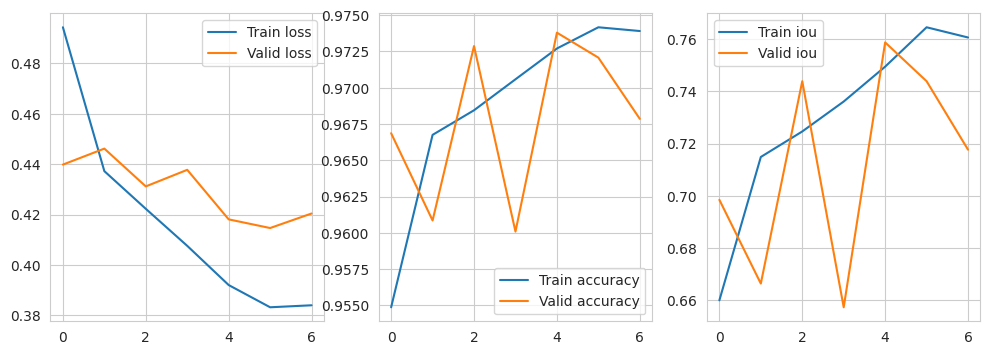

In [ ]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()

4/4 [==============================] - 1s 12ms/step


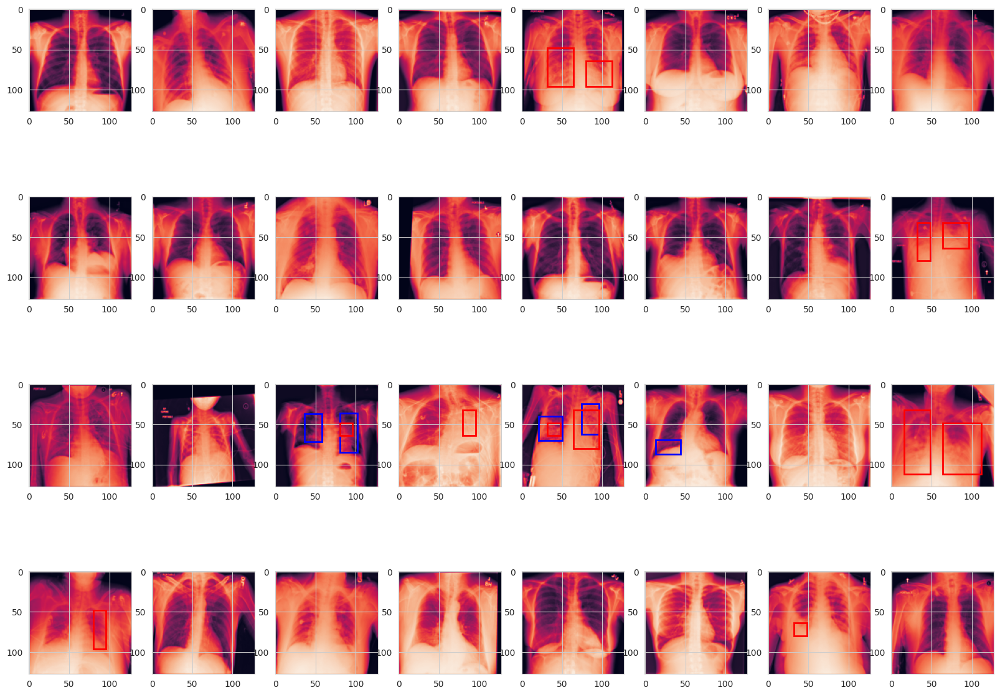

In [ ]:
i=0
for imgs, msks in valid_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(4, 8, figsize=(20,15))
    axarr = axarr.ravel()
    axidx = 0
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        i=i+1
        #exit after 32 images
        if i>32:
            break
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='b',facecolor='none'))
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)


test accuracy: 95.7


The CNN model, hyperparameters are changed like optimizer is changed from Adam to RMSprop, learning rate is changed from 0.0001 to 0.005, number of epochs is increased. the accuracy of training and validation increased a bit. a validation data is used in the model to predict the images along with bounding boxes.

# TRAINING WITH TRANSFER LEARNING VGG19 AFTER FINE TUNING

A few hyper parameter fine tuning is done to the previous VGG transfer model.

1) One more layer,dropout,batch normalization is added

2)activation is changed from sigmoid to softmax

3) Data is trained for more epochs

In [ ]:
import os
import csv
import random
import pydicom
import numpy as np
import pandas as pd
from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tqdm import tqdm

%matplotlib inline

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Capstone-project/stage_2_train_labels.csv')


In [ ]:
df['path']='/content/stage_2_train_images/'+df['patientId'].astype(str)+'.dcm'
negative=df[df['Target']==0]
print(len(negative))

20672


In [ ]:
positive=df[df['Target']==1]
unique_positive=positive[['path','patientId']]
path=unique_positive['path'].unique()
patientId=unique_positive['patientId'].unique()

unique_positive=pd.DataFrame({'path':path,'patientId':patientId})
len(unique_positive)


6012

In [ ]:
for _,row in tqdm(unique_positive.iterrows()):
    img=pydicom.read_file(row['path']).pixel_array
    img=resize(img,(256,256))
    plt.imsave('/content/working/data/positive/'+row['patientId']+'.jpg',img,cmap='gray')

6012it [05:24, 18.52it/s]


In [ ]:
for _,row in tqdm(negative.iterrows()):
    img=pydicom.read_file(row['path']).pixel_array
    img=resize(img,(256,256))
    plt.imsave('/content/working/data/negative/'+row['patientId']+'.jpg',img,cmap='gray')

20672it [19:30, 17.66it/s]


In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19,preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
datagen=ImageDataGenerator(samplewise_center=True,samplewise_std_normalization=True,horizontal_flip=True,
                          width_shift_range=0.05,rescale=1/255,fill_mode='nearest',height_shift_range=0.05,
                           preprocessing_function=preprocess_input,validation_split=0.3,
                          )


In [ ]:
train=datagen.flow_from_directory('/content/working/data',color_mode='rgb',batch_size=32,target_size=(256, 256),
                                  class_mode='binary',subset='training')
test=datagen.flow_from_directory('/content/working/data',color_mode='rgb',batch_size=32,target_size=(256, 256),
                                 class_mode='binary',subset='validation')

Found 18680 images belonging to 3 classes.
Found 8004 images belonging to 3 classes.


In [ ]:
pre_trained_model = VGG19(input_shape = (256,256,3),
                                include_top = False,
                                weights = 'imagenet')

for layer in pre_trained_model.layers:
    layer.trainable = False

# pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('block5_pool')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

80134624/80134624 [==============================] - 0s 0us/step
last layer output shape:  (None, 8, 8, 512)


In [ ]:
from tensorflow.keras.layers import Flatten,Dense,Dropout,BatchNormalization,LeakyReLU,ReLU,GaussianDropout

In [ ]:
model = Flatten()(last_output)
model = Dense(1024)(model)
model=ReLU(0.1)(model)
model=Dropout(0.25)(model)
model=BatchNormalization()(model)
model = Dense(1024)(model)
model=ReLU(0.1)(model)
model=Dropout(0.25)(model)
model=BatchNormalization()(model)
model=ReLU(0.1)(model)
model=Dropout(0.25)(model)
model=BatchNormalization()(model)
model = Dense(1, activation='softmax')(model)

In [ ]:
from tensorflow.keras.models import Model


In [ ]:
fmodel = Model( pre_trained_model.input, model)

fmodel.compile(optimizer = 'adam',
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

fmodel.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau


In [ ]:
early=EarlyStopping(monitor='accuracy',patience=3,mode='auto')
reduce_lr = ReduceLROnPlateau(monitor='accuracy', factor=0.5,
                              patience=2, verbose=1,cooldown=0, mode='auto',min_delta=0.0001, min_lr=1e-5)

In [ ]:
history=fmodel.fit(train,epochs=10,callbacks=[reduce_lr],
           steps_per_epoch=100,validation_data=test)

Epoch 1/10
100/100 [==============================] - 200s 2s/step - loss: -0.1723 - accuracy: 0.7694 - val_loss: -0.9357 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 2/10
100/100 [==============================] - 181s 2s/step - loss: -2.1665 - accuracy: 0.7731 - val_loss: -3.4766 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 3/10
100/100 [==============================] - 182s 2s/step - loss: -7.0698 - accuracy: 0.7756 - val_loss: -9.9601 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 4/10
100/100 [==============================] - 189s 2s/step - loss: -20.8032 - accuracy: 0.7638 - val_loss: -23.0826 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 5/10
100/100 [==============================] - ETA: 0s - loss: -44.8145 - accuracy: 0.7691
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
100/100 [==============================] - 179s 2s/step - loss: -44.8145 - accuracy: 0.7691 - val_loss: -48.6030 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 6/10
100/100 [=======================

<Axes: >

<Figure size 3000x2000 with 0 Axes>

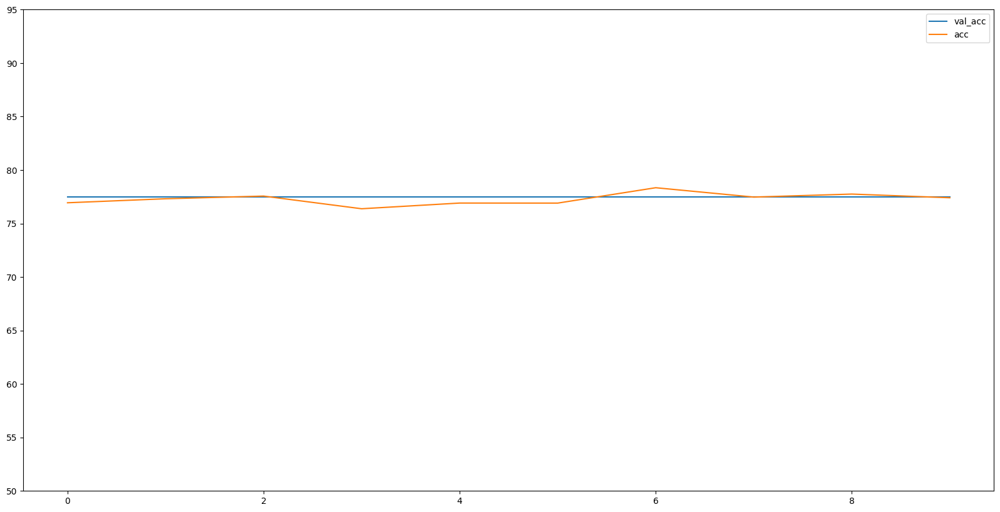

In [ ]:
plt.figure(figsize=(30,20))
val_acc=np.asarray(fmodel.history.history['val_accuracy'])*100
acc=np.asarray(fmodel.history.history['accuracy'])*100
acc=pd.DataFrame({'val_acc':val_acc,'acc':acc})
acc.plot(figsize=(20,10),yticks=range(50,100,5))

<Axes: >

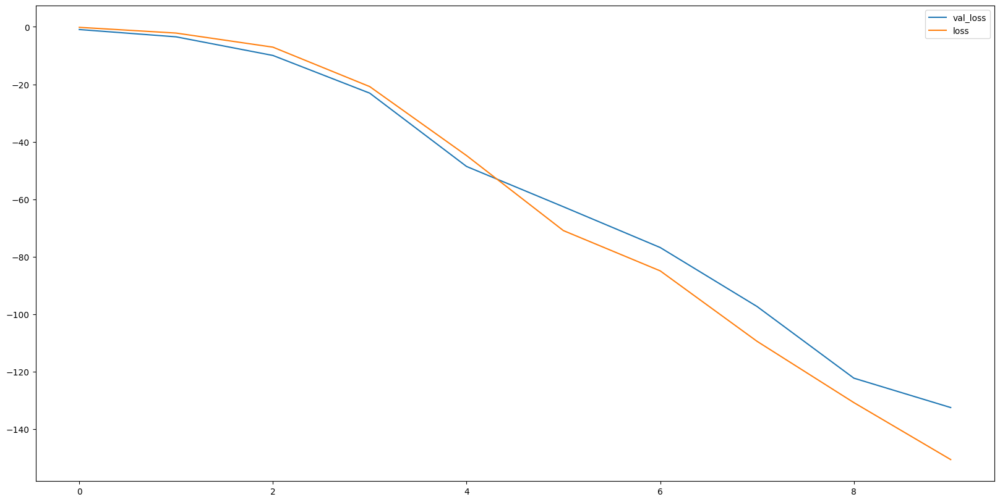

In [ ]:
loss=fmodel.history.history['loss']
val_loss=fmodel.history.history['val_loss']
loss=pd.DataFrame({'val_loss':val_loss,'loss':loss})
loss.plot(figsize=(20,10))


In [ ]:
y=[]

test.reset()

for i in tqdm(range(84)):
    _,tar=test.__getitem__(i)
    for j in tar:
        y.append(j)

100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


In [ ]:
test.reset()
y_pred=fmodel.predict(test)

251/251 [==============================] - 130s 518ms/step


In [ ]:
pred=[]
for i in y_pred:
    if i[0]>=0.5:
        pred.append(1)
    else:
        pred.append(0)

In [ ]:
from sklearn.metrics import roc_curve,auc,precision_recall_curve,classification_report

In [ ]:
# Classification report
print(classification_report(y,pred[:len(y)]))

              precision    recall  f1-score   support

         1.0       0.76      1.00      0.86      2045
         2.0       0.00      0.00      0.00       643

    accuracy                           0.76      2688
   macro avg       0.38      0.50      0.43      2688
weighted avg       0.58      0.76      0.66      2688



Text(113.9222222222222, 0.5, 'true label')

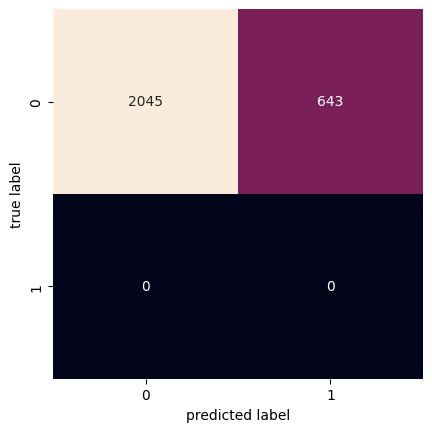

In [ ]:
from sklearn.metrics import confusion_matrix
mat=confusion_matrix(y, pred[:len(y)])
sns.heatmap(mat.T,square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('predicted label')
plt.ylabel('true label')

The accuracy didnot increase much after hyperparameter tuning.

In [ ]:
import PIL
import torch
import torchvision
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["axes.grid"] = False

In [ ]:
seed = 42
num_classes = 2
batch_size = 10
train_img_size = 256
origin_img_size = 1024
scale_factor = train_img_size / origin_img_size
np.random.seed(seed)

In [ ]:
train_df = "/content/drive/MyDrive/Capstone-project/stage_2_train_images.zip"
test_df = "/content/stage_2_test_images"
detailed_df = "/content/drive/MyDrive/Capstone-project/stage_2_detailed_class_info.csv"
labels_csv = "/content/drive/MyDrive/Capstone-project/stage_2_train_labels.csv"
submission_csv= "/content/drive/MyDrive/Capstone-project/stage_2_sample_submission.csv"
rcnn_losses = ["loss_objectness", "loss_box_reg", "loss_rpn_box_reg"]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_imgs = os.listdir(os.path.join(detailed_df, train_df))
test_imgs =  [patienId + ".dcm" for patienId in pd.read_csv(os.path.join(detailed_df, submission_csv)).patientId]

In [ ]:
from sklearn.model_selection import train_test_split

train_imgs, valid_imgs = train_test_split(train_imgs, test_size=0.33, random_state=seed)

print(f"Number of training samples: {len(train_imgs)}")
print(f"Number of validation samples: {len(valid_imgs)}")

Number of training samples: 17878
Number of validation samples: 8806


In [ ]:
train_label_df = pd.read_csv(os.path.join(detailed_df, labels_csv))
train_label_df.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [ ]:
isna_count = len(train_label_df[train_label_df.Target == 0]) # number of images without bounding box
train_label_df = train_label_df[train_label_df.Target == 1]
train_label_df.rename(columns={"x": "X0", "y": "Y0"}, inplace=True)
train_label_df["X1"] = train_label_df["X0"] + train_label_df["width"]
train_label_df["Y1"] = train_label_df["Y0"] + train_label_df["height"]
train_label_df[["X0", "X1", "Y0", "Y1"]] = train_label_df[["X0", "X1", "Y0", "Y1"]] * scale_factor
train_label_df["area"] = train_label_df["width"] * scale_factor * train_label_df["height"] * scale_factor
train_label_df.drop(["width", "height"], axis=1, inplace=True)
train_label_df.head()

,patientId,X0,Y0,Target,X1,Y1,area
4,00436515-870c-4b36-a041-de91049b9ab4,66.00,38.00,1,119.25,132.75,5045.4375
5,00436515-870c-4b36-a041-de91049b9ab4,140.50,38.00,1,204.50,151.25,7248.0000
8,00704310-78a8-4b38-8475-49f4573b2dbb,80.75,144.25,1,120.75,170.25,1040.0000
9,00704310-78a8-4b38-8475-49f4573b2dbb,173.75,143.75,1,214.25,178.00,1387.1250
14,00aecb01-a116-45a2-956c-08d2fa55433f,72.00,80.50,1,95.50,114.25,793.1250


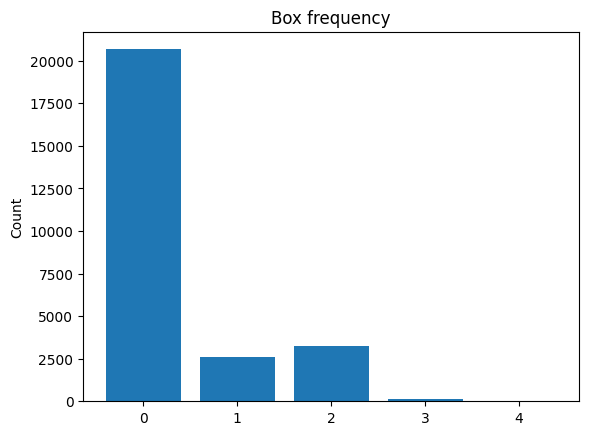

In [ ]:
from collections import Counter

cnt = Counter(train_label_df.patientId)
sample_batch = [sample[0] + ".dcm" for sample in cnt.most_common(2)] # We will take two imgs with 4 boxes to display
counts = pd.Series(cnt.values()).value_counts()
counts[0] = isna_count
plt.title("Box frequency")
plt.ylabel("Count")
plt.xticks(counts.index)
plt.bar(counts.index, counts)
plt.show()
del cnt

In [ ]:
counts.sort_values(ascending=False)

0    20672
2     3266
1     2614
3      119
4       13
dtype: int64

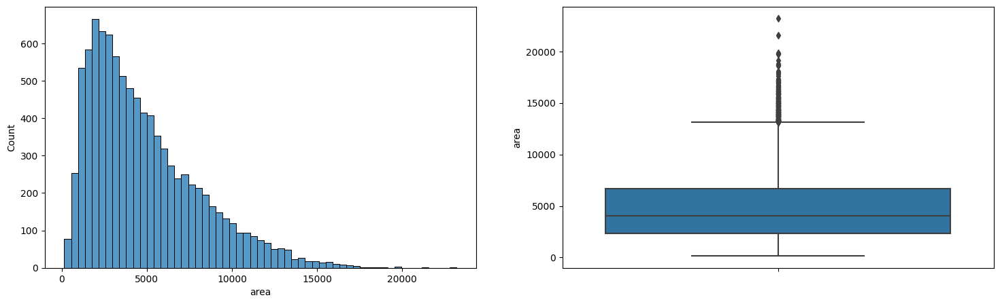

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18, 5))
sns.histplot(data=train_label_df, x="area", ax=axs[0])
sns.boxplot(y=train_label_df["area"])
plt.show()

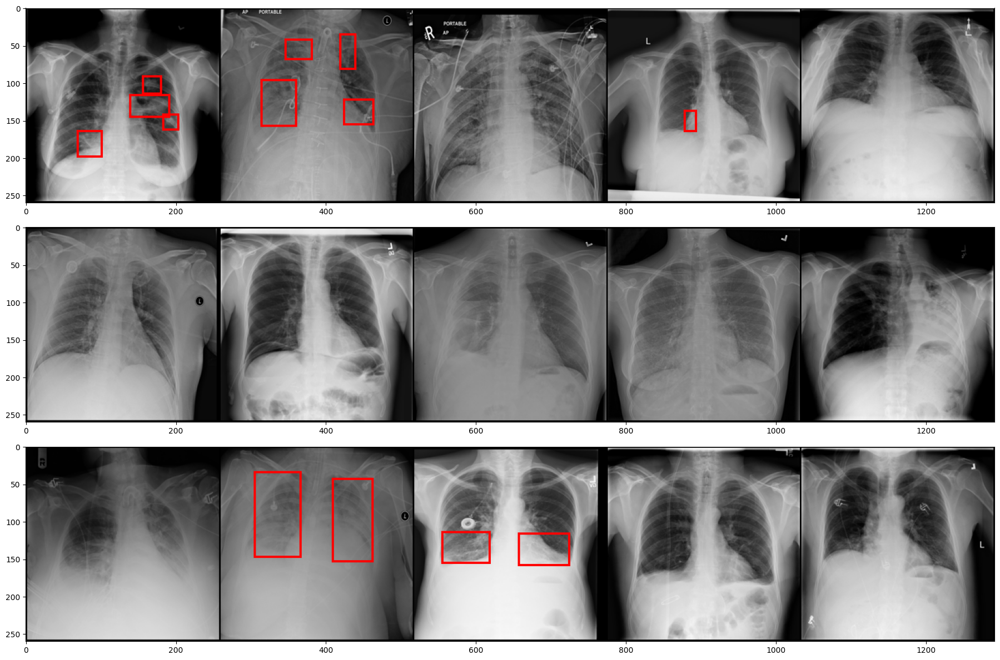

In [ ]:
from torchvision.utils import draw_bounding_boxes, make_grid


def find_boxes(img_name, label_df):
    patient_id = img_name.split(".")[0]
    boxes = label_df[label_df.patientId == patient_id]
    boxes_coord = boxes[["X0", "Y0", "X1", "Y1"]].to_numpy()

    return boxes_coord, boxes.area.to_numpy()


def read_images(img_names, label_df, resize):
    batch = []
    for img_name in img_names:
        img_path = os.path.join(detailed_df, train_df, img_name)
        img = PIL.Image.fromarray(pydicom.dcmread(img_path).pixel_array).convert("RGB")
        img = img.resize(resize)
        img = np.array(img)

        boxes, _ = find_boxes(img_name, label_df)

        img = torch.tensor(img, dtype=torch.uint8)
        boxes = torch.tensor(boxes, dtype=torch.int32)
        batch.append((img, boxes))
    return batch


def plot_samples(batch, n_rows=3, n_cols=5, box_color="red", titles=None, box_width=3, fig_size=(20,12)):
    assert len(batch) >= n_rows * n_cols, f"Not enough samples to display, required at least {n_rows * n_cols} samples"
    fig, axs = plt.subplots(n_rows, 1, figsize=fig_size)
    fig.tight_layout()
    imgs_with_boxes = []
    for sample in batch[:n_rows * n_cols]:
        scores = None
        if len(sample) == 2:
            image, boxes = sample
        else:
            image, boxes, scores = sample
            scores = [f"Score: {score:.2f}" for score in scores]

        img = draw_bounding_boxes(image=image.permute(2, 0, 1),
                                  boxes=boxes,
                                  colors=box_color,
                                  labels=scores,
                                  width=box_width)
        imgs_with_boxes.append(img)

    for i, ax in enumerate(axs):
        if titles:
            ax.set_title(titles[i], fontsize=18)
        img_with_boxes = make_grid(imgs_with_boxes[i * n_cols: (i + 1) * n_cols]).numpy()
        ax.imshow(np.transpose(img_with_boxes, (1, 2, 0)))
    plt.show()


sample_batch = np.concatenate([sample_batch, np.random.choice(train_imgs, size=13)])
sample_batch = read_images(sample_batch, train_label_df, (train_img_size, train_img_size))
plot_samples(sample_batch)

In [ ]:
import imgaug
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

class Augmentation:
    def __init__(self,
                 x_translation=(-0.05, 0.05),
                 rotate=(-5, 5),
                 scale=(0.9, 1.1),
                 noice=(0, 10),
                 blur=(0, 0.1)):

        self.transform = iaa.Sequential([
            iaa.Affine(translate_percent={"x": x_translation}, scale=scale, rotate=rotate),
            iaa.AdditiveGaussianNoise(scale=noice),
            iaa.GaussianBlur(sigma=blur)])

    def __call__(self, image, boxes):
        bbs = BoundingBoxesOnImage([BoundingBox(x1=box[0], y1=box[1], x2=box[2], y2=box[3])
                                    for box in boxes], shape=image.shape)

        image, bbs = self.transform(image=image, bounding_boxes=bbs)
        return image, bbs.to_xyxy_array()

    def worker_init_fn(self, worker_id):
        """Set unique seed for each worker."""
        imgaug.seed(np.random.get_state()[1][0] + worker_id)
from torchvision.transforms import PILToTensor, ConvertImageDtype

class PneumoniaDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms, img_names, train_img_size, labels=None):
        self.root = root
        self.transforms = transforms
        self.img_names = img_names
        self.resize = (train_img_size, train_img_size)
        self.labels = labels

    def __getitem__(self, idx):
        """Load image, boxes and process them"""
        img_name = self.img_names[idx]

        img_path = os.path.join(self.root, self.img_names[idx])
        img = PIL.Image.fromarray(pydicom.dcmread(img_path).pixel_array).convert("RGB")
        img = img.resize(self.resize)
        img = np.array(img)

        if self.labels is None:
            return torch.tensor(img / 255.).permute(2, 0, 1).float()

        boxes, area = find_boxes(img_name, self.labels)
        n_objects = len(boxes)
        if self.transforms is not None:
            img, boxes = self.transforms(img, boxes)

        img = torch.tensor(img / 255.).permute(2, 0, 1).float()

        target = {}
        target["image_id"] = torch.tensor([idx])
        target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
        target["labels"] = torch.ones(n_objects, dtype=torch.int64)
        target["area"] = torch.as_tensor(area, dtype=torch.float32)
        target["iscrowd"] = torch.zeros(n_objects, dtype=torch.int32)
        return img, target

    def __len__(self):
        return len(self.img_names)

    def collate_fn(self, batch):
        return tuple(zip(*batch))

In [ ]:
from torch.utils.data import DataLoader

augmentation = Augmentation()
train_ds = PneumoniaDataset(os.path.join(detailed_df, train_df), augmentation, train_imgs, train_img_size, train_label_df)
valid_ds = PneumoniaDataset(os.path.join(detailed_df, train_df), None, valid_imgs, train_img_size, train_label_df)
test_ds = PneumoniaDataset(os.path.join(detailed_df, test_df), None, test_imgs, train_img_size)

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=train_ds.collate_fn,
                          worker_init_fn=augmentation.worker_init_fn)
valid_loader = DataLoader(valid_ds, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=valid_ds.collate_fn)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=2)

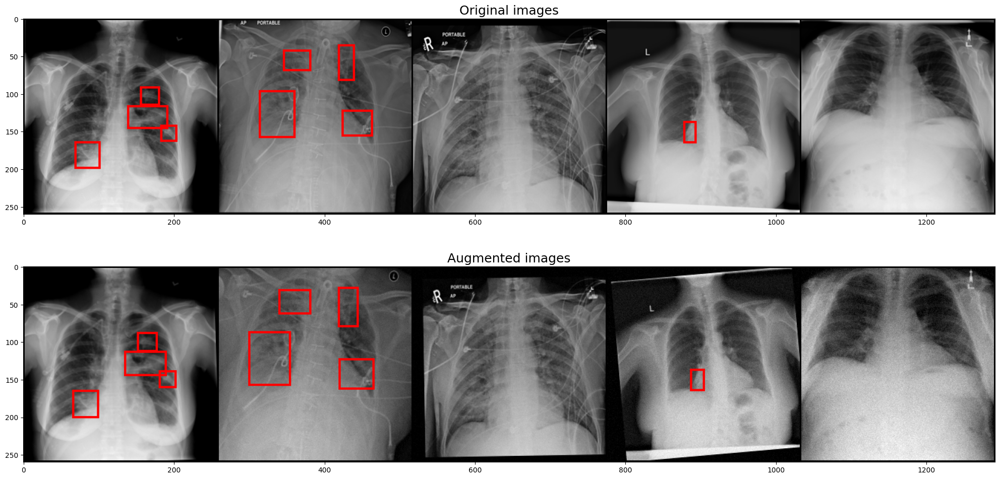

In [ ]:
def process_batch(idx, sample):
    img, boxes = sample

    augmentation = Augmentation()
    augmentation.worker_init_fn(idx)
    img, boxes = augmentation(img.numpy(), boxes.numpy())
    img = torch.tensor(img, dtype=torch.uint8)
    boxes = torch.tensor(boxes, dtype=torch.float32)
    return img, boxes


augmented_batch = sample_batch[:5] + [process_batch(i, sample) for i, sample in enumerate(sample_batch[:5])]
plot_samples(augmented_batch, titles=["Original images", "Augmented images"], fig_size=(20, 10), n_rows=2)
del sample_batch, augmented_batch

In [ ]:
!pip install git+https://github.com/PyTorchLightning/pytorch-lightning
import pytorch_lightning as pl
print(pl.__version__)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/PyTorchLightning/pytorch-lightning to /tmp/pip-req-build-vp3exbfz
  Running command git clone --filter=blob:none --quiet https://github.com/PyTorchLightning/pytorch-lightning /tmp/pip-req-build-vp3exbfz
  Resolved https://github.com/PyTorchLightning/pytorch-lightning to commit 3a68493d0aa73ef8df88d5ec09e400c2285a501e
  Running command git submodule update --init --recursive -q
  Encountered 31 file(s) that should have been pointers, but weren't:
        .notebooks/course_UvA-DL/01-introduction-to-pytorch.ipynb
        .notebooks/course_UvA-DL/02-activation-functions.ipynb
        .notebooks/course_UvA-DL/03-initialization-and-optimization.ipynb
        .notebooks/course_UvA-DL/04-inception-resnet-densenet.ipynb
        .notebooks/course_UvA-DL/05-transformers-and-MH-attention.ipynb
        .notebooks/course_UvA-DL/06-graph-neural-networks.ipynb
        .notebo

In [ ]:
import pytorch_lightning as pl
from torchvision.ops import nms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


class LitRCNN(pl.LightningModule):
    def __init__(self, num_classes):
        super().__init__()

        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

        self.model = model

    def forward(self, x):
        self.model.eval()

        outputs =  self.model(x)

        preds = []
        for output in outputs:
            boxes = output["boxes"]
            scores = output["scores"]
            idx = nms(boxes,scores, 0.05)
            preds.append({"boxes": boxes[idx].cpu().detach().numpy(), "scores": scores[idx].cpu().detach().numpy()})

        return preds

    def training_step(self, batch, batch_idx):
        images, targets = batch

        losses = self.model(images, targets)

        loss = sum(loss for loss in losses.values())
        self.log_losses(loss, losses)

        return loss

    def validation_step(self, batch, batch_idx):
        self.model.train()

        images, targets = batch
        losses = self.model(images, targets)

        loss = sum(loss for loss in losses.values())
        self.log_losses(loss, losses, mode="val")

    def predict_step(self, batch, batch_idx):
        return self.forward(batch)

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(),  lr=0.005, momentum=0.9, weight_decay=0.0005)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.3)

        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "epoch",
                "frequency": 1}}

    def log_losses(self, loss, losses, mode="train"):
        self.log_dict({f"{mode}_loss": loss,
                       f"{mode}_loss_box_reg": losses['loss_box_reg'],
                       f"{mode}_loss_objectness": losses['loss_objectness'],
                       f"{mode}_loss_rpn_box_reg": losses['loss_rpn_box_reg']}, on_step=False, on_epoch=True, batch_size=batch_size)

model = LitRCNN(num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 261MB/s]


In [ ]:
from pytorch_lightning import Callback
from pytorch_lightning.callbacks import ModelCheckpoint


class MetricsCallback(Callback):
    """PyTorch Lightning metric callback."""

    def __init__(self, metrics):
        super().__init__()
        self.metrics = metrics
        self.training = {}
        self.validations = {}

    def on_train_epoch_end(self, trainer, pl_module):
        self.training[trainer.current_epoch] = {metric: trainer.callback_metrics["train_" + metric] for metric in self.metrics}

    def on_validation_end(self, trainer, pl_module):
        self.validations[trainer.current_epoch] = {metric: trainer.callback_metrics["val_" + metric] for metric in self.metrics}


checkpoint_callback = ModelCheckpoint(dirpath='checkpoints',
                                      filename='{epoch}-{val_loss:.4f}',
                                      every_n_epochs=1,
                                      monitor='val_loss',
                                      save_top_k=1,
                                      mode='min')

callbacks = [MetricsCallback(["loss"] + rcnn_losses), checkpoint_callback]

In [ ]:
%%capture
! pip install git+https://github.com/PytorchLightning/pytorch-lightning.git@master --upgrade

In [ ]:
import os

import torch
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST
from torchvision import transforms

import pytorch_lightning as pl

class CoolSystem(pl.LightningModule):

    def __init__(self, classes=10):
        super().__init__()
        self.save_hyperparameters()

        # not the best model...
        self.l1 = torch.nn.Linear(28 * 28, self.hparams.classes)

    def forward(self, x):
        return torch.relu(self.l1(x.view(x.size(0), -1)))

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = F.cross_entropy(y_hat, y)
        tensorboard_logs = {'train_loss': loss}
        return {'loss': loss, 'log': tensorboard_logs}

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = F.cross_entropy(y_hat, y)
        return {'val_loss': loss}

    def validation_epoch_end(self, outputs):
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        return {'val_loss': avg_loss}

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.001)

In [ ]:
device = "gpu" if torch.cuda.is_available() else "cpu"
print(device)
trainer = pl.Trainer(accelerator=device, max_epochs=10, callbacks=callbacks)
trainer.fit(model=model, train_dataloaders=train_loader, val_dataloaders=valid_loader)

gpu


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params
-------------------------------------
0 | model | FasterRCNN | 41.3 M
-------------------------------------
41.1 M    Trainable params
222 K     Non-trainable params
41.3 M    Total params
165.197   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
model = LitRCNN.load_from_checkpoint(trainer.checkpoint_callback.best_model_path, num_classes=num_classes)
print(trainer.checkpoint_callback.best_model_path)

/content/checkpoints/epoch=2-val_loss=0.0757.ckpt


In [ ]:
sample_batch_idx = np.random.choice(len(valid_imgs), size=5)
sample_batch = read_images(np.array(valid_ds.img_names)[sample_batch_idx], train_label_df, (train_img_size, train_img_size))

In [ ]:
sample_batch_idx

array([ 769, 6949, 2433, 5311, 5051])

In [ ]:
dpt=[valid_ds[i][0] for i in sample_batch_idx]

In [ ]:
dpt

[tensor([[[0.4353, 0.2431, 0.1137,  ..., 0.7216, 0.7451, 0.7137],
          [0.2745, 0.1333, 0.0667,  ..., 0.6353, 0.6706, 0.6588],
          [0.2471, 0.1216, 0.0588,  ..., 0.3176, 0.3961, 0.4667],
          ...,
          [0.0549, 0.0549, 0.0549,  ..., 0.0941, 0.2824, 0.4667],
          [0.0549, 0.0549, 0.0549,  ..., 0.0980, 0.2902, 0.4824],
          [0.0549, 0.0549, 0.0549,  ..., 0.1059, 0.3020, 0.4902]],
 
         [[0.4353, 0.2431, 0.1137,  ..., 0.7216, 0.7451, 0.7137],
          [0.2745, 0.1333, 0.0667,  ..., 0.6353, 0.6706, 0.6588],
          [0.2471, 0.1216, 0.0588,  ..., 0.3176, 0.3961, 0.4667],
          ...,
          [0.0549, 0.0549, 0.0549,  ..., 0.0941, 0.2824, 0.4667],
          [0.0549, 0.0549, 0.0549,  ..., 0.0980, 0.2902, 0.4824],
          [0.0549, 0.0549, 0.0549,  ..., 0.1059, 0.3020, 0.4902]],
 
         [[0.4353, 0.2431, 0.1137,  ..., 0.7216, 0.7451, 0.7137],
          [0.2745, 0.1333, 0.0667,  ..., 0.6353, 0.6706, 0.6588],
          [0.2471, 0.1216, 0.0588,  ...,

In [ ]:
dpt[0].type()

'torch.FloatTensor'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
device

device(type='cuda')

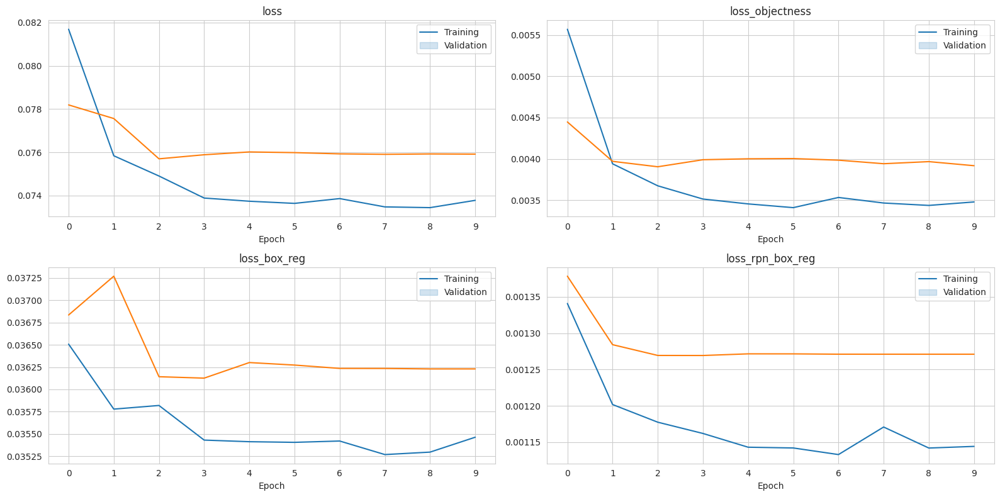

In [ ]:
sns.set_style("whitegrid")
training = pd.DataFrame.from_dict(callbacks[0].training, orient="index").applymap(lambda x: x.cpu().numpy())
validations = pd.DataFrame.from_dict(callbacks[0].validations, orient="index").applymap(lambda x: x.cpu().numpy())
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for ax, metric in zip(axs.flat, callbacks[0].metrics):
    ax.set_title(metric)

    g = sns.lineplot(data=training, x=training.index, y=metric, ax=ax)
    g = sns.lineplot(data=validations, x=validations.index, y=metric, ax=ax)
    g.set(xlabel="Epoch", ylabel=None)
    g.set_xticks(training.index)
    ax.legend(labels=["Training","Validation"])

fig.tight_layout()
plt.show()

In [ ]:
history = trainer.validate(model, dataloaders=valid_loader, verbose=False)
pd.DataFrame(history, index=["Validation"]).T

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

,Validation
val_loss,0.075692
val_loss_box_reg,0.036142
val_loss_objectness,0.003911
val_loss_rpn_box_reg,0.001269


In [ ]:
preds = trainer.predict(model, test_loader)

outputs = []
for batch_pred in preds:
    for sample_pred in batch_pred:
        scores, boxes = sample_pred["scores"], sample_pred["boxes"]
        if len(scores) == 0:
            outputs.append(np.nan)
        else:
            label = ""
            boxes = boxes / scale_factor
            for score, box in zip(scores, boxes):
                label += f"{score:.2f} {box[0]:.1f} {box[1]:.1f} {(box[2]-box[0]):.1f} {(box[3]-box[1]):.1f} "
            outputs.append(label.strip())

submission = pd.read_csv(os.path.join(detailed_df, submission_csv))
submission.PredictionString = outputs
submission.to_csv("submission.csv", header=True, index=False)
submission

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

,patientId,PredictionString
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,NaN
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,NaN
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,NaN
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,NaN
4,00100a24-854d-423d-a092-edcf6179e061,0.65 520.8 369.9 264.7 462.9 0.47 183.5 419.8 ...
...,...,...
2995,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,0.24 329.0 147.6 192.0 378.5 0.18 608.4 583.0 ...
2996,c1ec035b-377b-416c-a281-f868b7c9b6c3,0.14 230.4 577.6 230.2 192.8
2997,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,NaN
2998,c1ef6724-f95f-40f1-b25b-de806d9bc39d,0.65 217.5 366.1 233.0 347.2 0.46 614.9 330.7 ...


In [ ]:
preds

[[{'boxes': array([], shape=(0, 4), dtype=float32),
   'scores': array([], dtype=float32)},
  {'boxes': array([], shape=(0, 4), dtype=float32),
   'scores': array([], dtype=float32)},
  {'boxes': array([], shape=(0, 4), dtype=float32),
   'scores': array([], dtype=float32)},
  {'boxes': array([], shape=(0, 4), dtype=float32),
   'scores': array([], dtype=float32)},
  {'boxes': array([[130.21077 ,  92.47731 , 196.3898  , 208.19199 ],
          [ 45.874325, 104.938965, 105.47653 , 205.70166 ]], dtype=float32),
   'scores': array([0.64886177, 0.47426718], dtype=float32)},
  {'boxes': array([[ 51.87944 , 117.048546, 101.5743  , 168.86613 ]], dtype=float32),
   'scores': array([0.34305817], dtype=float32)},
  {'boxes': array([], shape=(0, 4), dtype=float32),
   'scores': array([], dtype=float32)},
  {'boxes': array([[ 68.96276 ,  82.21247 , 107.98192 , 124.41024 ],
          [ 38.394077, 132.24014 ,  99.499664, 175.19719 ],
          [146.04921 ,  69.294235, 185.70258 , 106.12181 ]], dtype=

In [ ]:
import pickle

In [ ]:
filename = 'model_final.sav'
pickle.dump(model, open(filename, 'wb'))

# OBSERVATIONS

To begin with the data is extracted and checked for duplicates,null values and are removed. it was preprocssed and used for model training

1)Model Score for LGBM Classifier:ROC-AUC for Target = 75%

2)Model score for Random Forest: F1score: 62%

3)The trained CNN model achieved a training accuracy of 0.97 and validation accuracy of 0.96, which is promising for the detection of pneumonia from chest radiographs. The training and validation loss is around 0.41

4)The transfer learning with VGG19 CNN model achieved a training accuracy of 0.77 and validation accuracy of 0.76. The training and validation loss is around -17. F1 score of 83%

5)The faster RCNN after data agumentation, using pytorch gave a validation loss of 0.007 and box regression of 0.03

6)The CNN model since gave the best result it was further fine hyperparameter tuned and got training accuracy of 0.9749 and validation accuracy of 0.9667 and a test accuracy of 95.7. validation loss reduced to 0.38

7)The VGG transfer learning model is fine tuned but the accuracy increased only fractionally

8)The RCNN model was ran for increased epochs to see better results. but the best loss was achived from the second epoch only.

# Pickling the best model

In [ ]:
import pickle

In [ ]:
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

The CNN after hyperparameter tuning gave the best results  so it was pickled for future uses to predict new data. also it is used to prepare a GUI model

# GUI model to predict X_Rays for pneumonia

In [ ]:
import numpy as np
import pickle
import pydicom as dicom
import cv2
from tkinter import *
from tkinter.ttk import *
# from keras.preprocessing import image
import keras.utils as image
import operator
from operator import itemgetter
from keras.applications.vgg16 import preprocess_input
from tkinter import filedialog
# loading Python Imaging Library
from PIL import ImageTk, Image

# To get the dialog box to open when required
# creating tkinter window
root = Tk()
root.geometry('800x500')
# Adding widgets to the root window
Label(root, text = 'Pneumonia Detection', font =('Verdana', 15)).pack(side = TOP, pady = 10)

global path,panelB,image_path1
image_path1=None


def open_img():
    path=filedialog.askopenfilename()
#     image_path = 'data/train_images/sample.dcm'
    ds = dicom.dcmread(path)
    pixel_array_numpy = ds.pixel_array
    image_format = '.jpg' # or '.png'
    global image_path
    image_path = path.replace('.dcm', image_format)
    cv2.imwrite(image_path, pixel_array_numpy)
    global panelA

    if len(path) > 0:
        image = Image.open(image_path)
        image = image.resize((450, 350), Image.ANTIALIAS)
        image = ImageTk.PhotoImage(image)
    if panelA is None and panelB is None:
        panelA = Label(image=image)
        panelA.image = image
        panelA.pack(side='left', padx=10, pady=10)
    else:
        panelA.configure(image=image)
        panelA.image = image



def check_pneumo():
    print(image_path)
    img=image.load_img(image_path,target_size=(128,128))
    x=image.img_to_array(img)
    x=np.expand_dims(x,axis=0)
    img_data=preprocess_input(x)
    print(x.shape)
    x=np.array(x)
    img_data= x.reshape(x.shape[0],x.shape[1]*x.shape[2]*x.shape[3])
    print(img_data.shape)

# result = loaded_model.predict(preprocess_input(img_data ))
    result = pickle.load(open('finalized_model.sav', 'rb'))
    result_final=result.predict(preprocess_input(img_data))
    print(result_final[1])
#     result_final[0] = 1
#     print(result_final[0])
    prediction = {"Pneumonia Present ": result_final[0]!=0,
                  "Pneumonia Absent": result_final[0] ==0,
                 }
    print(prediction)
    print(prediction.items())
    prediction_final = list(prediction.keys()) [list(prediction.values()).index(True)]
    print(prediction_final)
    global panelB
    if panelB is None:
        panelB = Label(text=(prediction_final), font =('Verdana', 15))
        panelB.text=(prediction_final)
        panelB.pack(side='right', padx=120, pady=20)
    else:
        panelB.configure(text=(prediction_final), font =('Verdana', 15))
        panelB.text = (prediction_final)
Button(root, text = 'Select Image',
 compound = LEFT,command = open_img).pack (side = TOP)
Button(root, text = 'Check X-Ray Image',
 compound = LEFT,command = check_pneumo).pack(side = TOP)
panelA=None
panelB=None
mainloop()

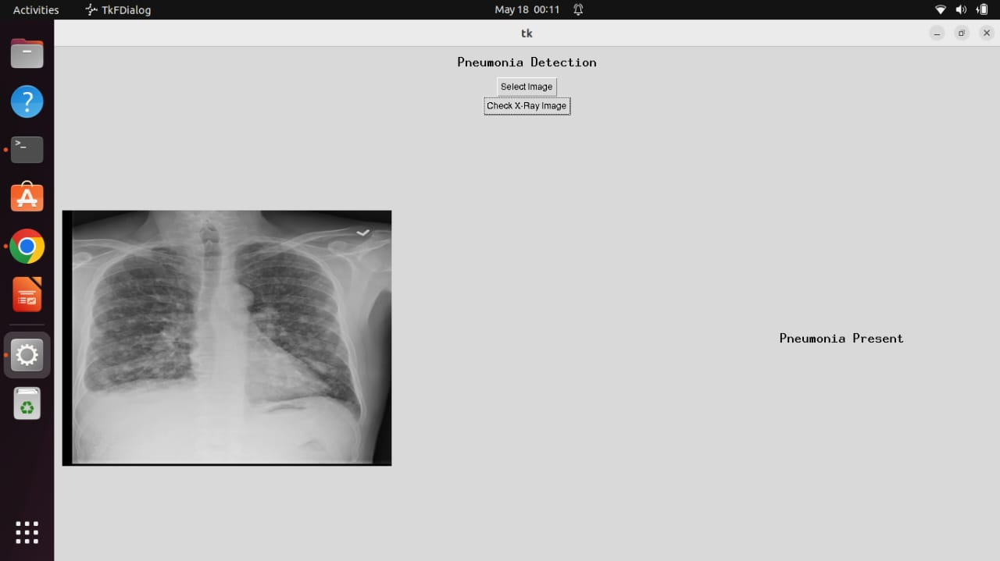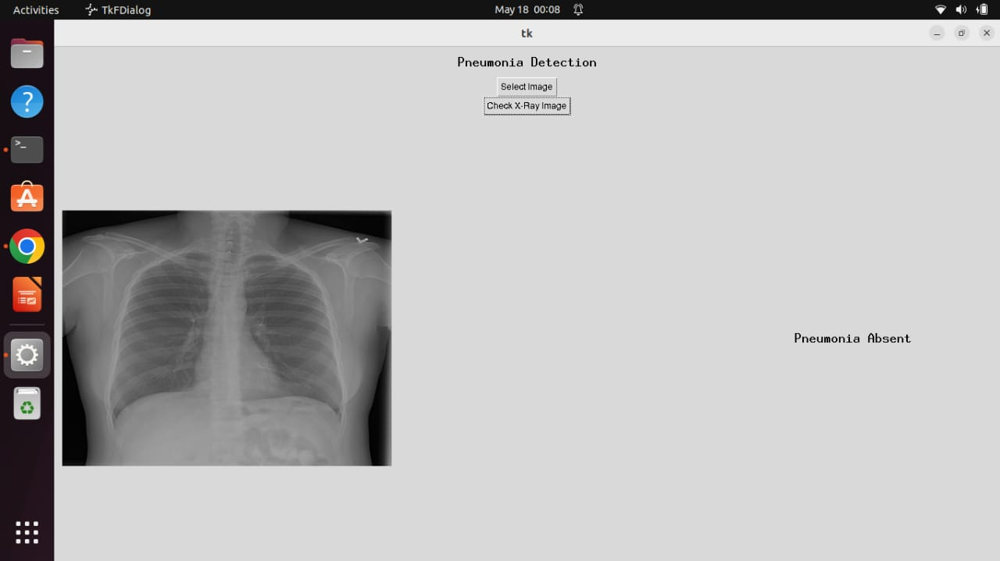

These above images are sample outputs of the random xray images run by the GUI interface.

A GUI model is developed so that we can add a X-Ray anytime and can predict whether the patient of the given X-Ray is affected by pneumonia or not. with this model it is easier to simply predict just by adding the X-Rays to the model